# Camo Worms Genetic Algorithm

## Imports

In [1]:
# Imports

import numpy as np
import imageio.v3 as iio
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.path as mpath
import matplotlib.patches as mpatches
import matplotlib.bezier as mbezier
from sklearn.metrics.pairwise import euclidean_distances
from sklearn.preprocessing import StandardScaler

rng = np.random.default_rng()
Path = mpath.Path
mpl.rcParams['figure.dpi']= 72 #size of images

## Image Preparation

## Global Variables (Experiment with different values)

In [2]:
# Global variables

POP_SIZE = 100
EPOCHS = 30 # MAX NUMBER OF EPOCHS
CLEW_SIZE = 30
MUTATION_RATE = 0.01
MUTATION_INTENSITY = 0.01
WEIGHTS = {'size': 1.0, 'color': 1.0, 'overlap': 5.0, 'straightness': 0.1, 'edge': 0}
# WEIGHTS = {'size': 0.5, 'color': 0.5, 'overlap': 5.0, 'straightness': 0.01, 'edge': 3.0}
PATIENCE = 5
MIN_DELTA = 0
IMAGE_DIR = 'images'
IMAGE_NAME='original'
MASK = [320, 560, 160, 880] # ymin ymax xmin xmax
TOURNAMENT_SIZE = 5

Image name (shape) (intensity max, min, mean, std)

original (240, 720) (210, 0, 49.3, 34.8)


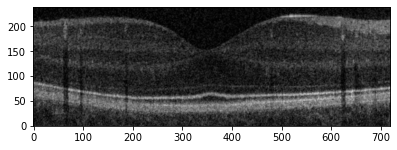

In [3]:
def crop (image, mask):
    h, w = np.shape(image)
    return image[max(mask[0],0):min(mask[1],h), max(mask[2],0):min(mask[3],w)]

def prep_image (imdir, imname, mask):
    print("Image name (shape) (intensity max, min, mean, std)\n")
    image = np.flipud(crop(iio.imread(imdir+'/'+imname+".png"), mask))
    print("{} {} ({}, {}, {}, {})".format(imname, np.shape(image), np.max(image), np.min(image), round(np.mean(image),1), round(np.std(image),1)))
    plt.imshow(image, vmin=0, vmax=255, cmap='gray', origin='lower') # use vmin and vmax to stop imshow from scaling
    plt.show()
    return image

image = prep_image(IMAGE_DIR, IMAGE_NAME, MASK)

In [4]:
# from PIL import Image
# different image prep method

# def crop(image, mask):
#     # Assuming mask is a tuple of (top, bottom, left, right) indices
#     h, w = image.shape
#     return image[max(mask[0], 0):min(mask[1], h), max(mask[2], 0):min(mask[3], w)]

# def prepare_image(filename, resize, mask=None):
#     # Load in image
#     image_path = f'images/{filename}'
#     image = Image.open(image_path)

#     # Resize the image to an appropriate size
#     image = image.resize(resize, Image.Resampling.LANCZOS)
    
#     # Convert the image to greyscale
#     greyscale_image = image.convert('L')
    
#     # Convert the greyscale image to a numpy array for analysis
#     image_array = np.array(greyscale_image)
    
#     # Apply cropping if a mask is provided
#     if mask:
#         image_array = crop(image_array, mask)
    
#     # Normalize the image array to be between 0 and 1 for processing
#     normalized_image_array = image_array / 255.0

#     # Flip the image vertically
#     normalized_image_array = np.flipud(normalized_image_array)

#     # Plotting the image
#     plt.imshow(normalized_image_array, cmap='gray')  # Use a grey colormap
#     plt.axis('off')  # Turn off axis numbers and ticks
#     plt.show()
    
#     return normalized_image_array

# # Mask format: (top, bottom, left, right)
# # mask is for cropping the image if required
# image = prepare_image('averaged.png', resize=(400, 200), mask=(50, 200, 0, 400))   

## Camo Worm Class

In [5]:
class Camo_Worm:
    def __init__(self, x, y, r, theta, deviation_r, deviation_gamma, width, colour):
        self.x = x
        self.y = y
        self.r = r
        self.theta = theta
        self.dr = deviation_r
        self.dgamma = deviation_gamma
        self.width = width
        self.colour = colour
        p0 = [self.x - self.r * np.cos(self.theta), self.y - self.r * np.sin(self.theta)]
        p2 = [self.x + self.r * np.cos(self.theta), self.y + self.r * np.sin(self.theta)]
        p1 = [self.x + self.dr * np.cos(self.theta+self.dgamma), self.y + self.dr * np.sin(self.theta+self.dgamma)]
        self.bezier = mbezier.BezierSegment(np.array([p0, p1,p2]))

    def control_points(self):
        return self.bezier.control_points

    def path(self):
        return mpath.Path(self.control_points(), [Path.MOVETO, Path.CURVE3, Path.CURVE3])

    def patch(self):
        return mpatches.PathPatch(self.path(), fc='None', ec=str(self.colour), lw=self.width, capstyle='round')

    def intermediate_points(self, intervals=None):
        if intervals is None:
            intervals = max(3, int(np.ceil(self.r/8)))
        return self.bezier.point_at_t(np.linspace(0,1,intervals))

    def approx_length(self):
        intermediates = intermediate_points(self)
        eds = euclidean_distances(intermediates,intermediates)
        return np.sum(np.diag(eds,1))

## Draw Worms Class

In [6]:
class Drawing:
    def __init__ (self, image):
        self.image = image

    def add_patches(self, patches):
        try:
            for patch in patches:
                self.ax.add_patch(patch)
        except TypeError:
            self.ax.add_patch(patches)

    def add_dots(self, points, radius=4, **kwargs):
        try:
            for point in points:
                self.ax.add_patch(mpatches.Circle((point[0],point[1]), radius, **kwargs))
        except TypeError:
            self.ax.add_patch(mpatches.Circle((points[0],points[1]), radius, **kwargs))

    def add_worms(self, worms, display=False):
        fig, ax = plt.subplots(figsize=(self.image.shape[1] / 100, self.image.shape[0] / 100), dpi=100)
        ax.imshow(self.image, cmap='gray', origin='upper')
        for worm in worms:
            ax.add_patch(worm.patch())
        ax.set_xlim([0, self.image.shape[1]])
        ax.set_ylim([0, self.image.shape[0]])
        ax.axis('off')
        if display:
            plt.show()
        fig.canvas.draw()
        data = np.frombuffer(fig.canvas.tostring_rgb(), dtype=np.uint8)
        data = data.reshape(fig.canvas.get_width_height()[::-1] + (3,))
        plt.close(fig)
        return data


    def show(self, save=None):
        if save is not None:
            plt.savefig(save)
        plt.show()

## Instance Class

In [35]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import cv2

class Instance:
    def __init__(self, image):
        """Initialize an instance of the instance class with the image"""
        self.image = image
        self.clew = []
        self.cost = None
        self.drawing = None
        self.rng = np.random.default_rng()
        self.edges, self.distance_transform = self.prepare_edge_data()

    def detect_edges(self, image):
        """
        Detects edges using the Canny edge algo, returning the edges detected based on the threshold selected
        This process should be run manually to identify the appropriate thresholds (theshold1 and threshold2)
        as well as the degree in which dilation is applied (np.ones((2, 2), np.uint8))
        """
        # check if image is colored (has shape/channel of 3) and convert it to grayscale.
        if len(image.shape) == 3:
            image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

        # check the image is the correct data type for OpenCV (uint8)
        if image.dtype != np.uint8:
            image = np.uint8(255 * image)

        # for improved edge detection, reduce noise by applying a guassian blur 
        blurred_image = cv2.GaussianBlur(image, (7, 7), 2)
        
        # perform edge detection with Canny algo; note: low and high threshold values controls the edge detection sensitivity
        edges = cv2.Canny(blurred_image, threshold1=100, threshold2=20)

        # prepare a kernel for dilation and dilate the edges. allowing for thicker edges if required
        kernel = np.ones((2, 2), np.uint8)
        dilated_edges = cv2.dilate(edges, kernel, iterations=1)
        return dilated_edges
    
    def prepare_edge_data(self):
        """
        Process the image to detect edges and then computes a distance transform.
        The distance transform creates a area where each cell contains the distance to the nearest edge.  
        Allowing for the optimisation the worm location relative to edges detected with cv2
        """
        edges = self.detect_edges(self.image) # detect edges in the image using the method detect_edges
        # DIST_L2 allows for Euclidean distance to be used
        # DIST_MASK_PRECISE allows for more precise distance calc
        distance_transform = cv2.distanceTransform(255 - edges, cv2.DIST_L2, cv2.DIST_MASK_PRECISE)
        return edges, distance_transform # return edge data + distance transform

    def get_local_edges(self, x, y, radius):
        """Gets a local area around the given point for edge analysis."""
        # check that all values are set to integers and within image boundaries
        x1 = int(max(0, x - radius)) # left boundary
        y1 = int(max(0, y - radius)) # upper boundary
        x2 = int(min(self.image.shape[1], x + radius)) # right boundary
        y2 = int(min(self.image.shape[0], y + radius)) # lower boundary
        return self.edges[y1:y2, x1:x2]

    def calculate_size_penalty(self):
        """Calculates a size penalty based on worm parameters, proximity to edges, and deviations from the ideal size"""
        penalty = 0 # set penalty value
        
        # set ideal ratios for the length and width of a worm relative to the image size
        ideal_length_ratio, ideal_width_ratio = 0.7, 0.2

        # iterate over each worm in the clew
        for worm in self.clew:
            # ensure x and y values are within image boundaries; else out of image errors occurred
            x_idx = int(np.clip(worm.x, 0, self.image.shape[1] - 1))
            y_idx = int(np.clip(worm.y, 0, self.image.shape[0] - 1))

            # get the nearest edge distance from the distance transform previously calculated 
            nearest_edge_distance = self.distance_transform[y_idx, x_idx]

            # change the ideal length and width based on the worms distance to the nearest edge
            adjusted_ideal_length = ideal_length_ratio * self.image.shape[1] * (1 / (1 + nearest_edge_distance / 100))
            adjusted_ideal_width = ideal_width_ratio * self.image.shape[0] * (1 / (1 + nearest_edge_distance / 100))

            # calc the penalties for deviation from the adjusted ideal length and width
            length_penalty = (worm.r - adjusted_ideal_length) ** 2
            width_penalty = (worm.width - adjusted_ideal_width) ** 2

            # combine the penalties and apply a scaling factor; this shrinks the penalty for larger worms.
            combined_penalty = length_penalty + width_penalty
            scaled_penalty = combined_penalty * np.exp(-0.05 * worm.r)

            # sum the scaled penalty into the total penalty.
            penalty += scaled_penalty

        return penalty

    def calculate_ideal_straightness(self, worm):
        """Calculates the ideal straightness for a worm based on angle of Canny predicted edges"""
        # Check that x, y, and radius are integers to allow for indexing
        x = int(worm.x)
        y = int(worm.y)
        radius = int(worm.r + 20) # slightly larger radius to include a reasonable area around the worm

        # get edge data from the area surrounding the worm.
        local_edges = self.get_local_edges(x, y, radius)

        # calc gradients along the x and y directions with Sobel; helps in getting the direction of edges
        grad_x = cv2.Sobel(local_edges, cv2.CV_64F, 1, 0, ksize=3)
        grad_y = cv2.Sobel(local_edges, cv2.CV_64F, 0, 1, ksize=3)

        # calc the angle of the gradients to find the edge directions
        angle = np.arctan2(grad_y, grad_x)

        # make a hist of edge directions to find the most common edge position/orientation
        hist, _ = np.histogram(angle, bins=36, range=(-np.pi, np.pi))
        # find the bin with the max count, corresponding to the most prevalent edge orientation
        dominant_orientation = np.argmax(hist) * (2 * np.pi / 36) - np.pi # Convert bin index back to angle

        # Return the absolute value of the most common orientation as the ideal straightness measure
        return abs(dominant_orientation)

    def calculate_overlap_penalty(self):
        """Calculates penalty based on overlapping areas of worms to discourage worms overlapping one another"""

        # create a mask for the entire image with the same image dim but only using binary values
        mask = np.zeros_like(self.image, dtype=np.uint8)
        overlap_penalty = 0 

        # iterate over each worm in the clew
        for worm in self.clew:
            # make a new mask for the current worm.
            worm_mask = np.zeros_like(mask)

            # set the center, axes, and angle for the ellipse representing the worm
            center = (int(worm.x), int(worm.y)) # centre of the ellipse
            axes = (int(worm.width / 2), int(worm.r)) # axes of the ellipse; width and radius define the shape
            angle = np.degrees(worm.theta) # convert angle from radians to degrees

            # draw the worm as a filled ellipse on the worm-specific mask.
            cv2.ellipse(worm_mask, center, axes, angle, 0, 360, 255, -1)

            # get the overlap between the current worm and all other worms
            overlap = cv2.bitwise_and(mask, worm_mask)

            # if there is any overlap, try find the area of the overlap
            if np.any(overlap):
                overlap_area = np.sum(overlap > 0)
                overlap_penalty += overlap_area  # increase penalty based on overlap area

            # update the main mask with the current worm
            mask = cv2.bitwise_or(mask, worm_mask)  
            
        # Return the total overlap penalty (sum of all overlapping areas)
        return overlap_penalty

    def extract_local_area(self, x, y, radius):
        """Extracts a square around the worm"""

        # find the max size of the square without exceeding the image boundary
        half_side = int(min(radius * 1.5, min(x, y, self.image.shape[1] - x, self.image.shape[0] - y)))

        # calc the starting and ending x and y indices for the square region to be extracted.
        start_x = max(int(x - half_side), 0)
        end_x = min(int(x + half_side), self.image.shape[1])
        start_y = max(int(y - half_side), 0)
        end_y = min(int(y + half_side), self.image.shape[0])

        # return the subsection of the image
        return self.image[start_y:end_y, start_x:end_x]
    
    def add_random_worm(self, size, imshape, init_params):
        """Generates a list of worms with random values and adds them to the clew"""
        
        clew = [] # where generated worms are stored

        # get init params
        (radius_std, deviation_std, width_theta) = init_params
        (ylim, xlim) = imshape

        # gen each worm w/ rand values
        for _ in range(size):
            # randomly determine the center position of the worm within the image boundaries
            midx = xlim * self.rng.random() # x-coord
            midy = ylim * self.rng.random() # y-coord

            # randomly generate radius and deviation from the standard deviations 
            r = radius_std * np.abs(self.rng.standard_normal()) # radius
            dr = deviation_std * np.abs(self.rng.standard_normal()) # deviation from centre
             
            # randomly determine orientation and color deviation angles
            theta = self.rng.random() * np.pi  # orientation angle
            dgamma = self.rng.random() * np.pi # colour deviation angle
            colour = self.rng.random() # colour value

            # get the average colour of local area
            local_area = self.extract_local_area(midx, midy, r)
            if np.any(local_area):  # check if local_area contains any data
                local_colour = np.mean(local_area) / 255 # normalise and use as the local color

            # get the width of the worm using a gamma distribution scaled by a value
            width = width_theta * self.rng.standard_gamma(3)

            # create a new worm object with the randomly generated parameters.
            worm = Camo_Worm(midx, midy, r, theta, dr, dgamma, width, colour)
            clew.append(worm) # append worm to list (clew)

        return clew

    def calculate_cost(self):
        """Calculates the cost based on various penalties"""

        # calcs penalties, log-transformed and normalized by the clew size
        size_penalty = np.log1p(self.calculate_size_penalty()) / len(self.clew) 
        color_cost = 10*np.log1p(self.calculate_local_color_cost()) / len(self.clew)  
        overlap_penalty = np.log1p(self.calculate_overlap_penalty()) / len(self.clew)  
        straightness_penalty = np.log1p(sum(self.straightness_penalty(worm) for worm in self.clew)) / len(self.clew)  
        edge_cost = np.log1p(sum(self.edge_cost(self.detect_edges(self.image), worm) for worm in self.clew)) / len(self.clew)  

        # weight param, represents the importance of each cost component
        weights = WEIGHTS
        self.cost = (weights['size'] * size_penalty +
                    weights['color'] * color_cost +
                    weights['overlap'] * overlap_penalty +
                    weights['straightness'] * straightness_penalty +
                    weights['edge'] * edge_cost)

        return self.cost # returns the normalised total cost
    
    def add_clew(self, size, clews=None):
        """Adds the clew of worms to the instance and updates the drawing. It also calculates their cumulative cost"""
        
        # check if a pre-existing clew is present
        if clews:
            self.clew = clews  # if present, use the existing clew
        else: # if not, generate a new clew randomly
            self.clew = self.add_random_worm(size, image.shape, (40, 30, 1))

        # draw the worms on the image
        self.drawing = Drawing(self.image)
        # Add the clew to the drawing
        self.drawing.add_worms(self.clew)

        # calc the cost of the current clew of worms
        self.calculate_cost()

        # return the newly drawn clew of worms
        return self.drawing

    def show_instance(self):
        """Displays the current instance if available"""
        
        if self.drawing: # check if the drawing exists
            self.drawing.show() # if it exists display the image

    def calculate_local_color_cost(self):
        """Calculates cost based on color differences in localized regions"""
        total_color_distance = 0

        for worm in self.clew:
            # get the local image area around the worm
            local_area = self.extract_local_area(worm.x, worm.y, worm.r)

            if local_area.size > 0:
                # calc the average color intensity in the local area
                mean_local_color = np.mean(local_area) / 255

                # calc the absolute difference in color
                color_distance = abs(mean_local_color - worm.colour)

                # add this difference to the total color distance
                total_color_distance += color_distance
            else:
                # deal w/ cases where area is empty or not valid (assign a high penalty or default cost)
                total_color_distance += 1  # assuming max color distance is ~ 1

        return total_color_distance

    def edge_cost(self, edges, worm):
        """Calculates cost based on how closely the worm aligns with and covers edges"""
        # calc the distance transform of the edge image
        distance_transform = cv2.distanceTransform(edges, cv2.DIST_L2, cv2.DIST_MASK_PRECISE)

        # make a binary mask for the worms path
        worm_mask = np.zeros_like(edges, dtype=np.uint8)

        # get the intermediate points along the Bezier curve that defines the worm's shape
        worm_points = worm.intermediate_points(intervals=100)  # intervals can be adjusted for a smoother line

        # draw points on the mask
        for point in worm_points:
            x, y = int(point[0]), int(point[1])
            if 0 <= x < worm_mask.shape[1] and 0 <= y < worm_mask.shape[0]:
                cv2.circle(worm_mask, (x, y), max(1, int(worm.width // 2)), 1, -1)  # draw circles to represent the worm's width

        # apply the worm mask to the distance transform to isolate distances at the worm's locations
        worm_distances = distance_transform * worm_mask

        # extract non-zero distances (where the worm is located)
        worm_edge_distances = worm_distances[worm_distances != 0]

        # calc the mean distance; lower distance means the worm is closer to an edge
        if worm_edge_distances.size > 0:
            mean_distance = np.mean(worm_edge_distances)
            # calc cost inversely proportional to the mean distance to encourage alignment with edges
            if mean_distance == 0:
                return 0  # no penalty if exactly covering the edge
            else:
                return 1 / mean_distance  # inverse relationship to encourage edge alignment
        else:
            # give a high penalty if the worm does not align close to any edges, discouraging this configuration.
            return 1000  # very high penalty to discourage placement away from edges
    
    def straightness_penalty(self, worm):
        """Calculates penalty based on deviation from straightness of closest edge, detected with detect_edges"""
        ideal_straightness = self.calculate_ideal_straightness(worm)
        return (worm.dgamma - ideal_straightness) ** 2

## Genetic Algorithm Class

In [43]:
import random

class Genetic_Algorithm:
    def __init__(self, mutation_rate=MUTATION_RATE, mutation_intensity=MUTATION_INTENSITY, patience=PATIENCE, min_delta=MIN_DELTA, tournament_size=TOURNAMENT_SIZE):
        self.mutation_rate = mutation_rate  # Default mutation rate is set to 10%
        self.mutation_intensity = mutation_intensity  # default is 0.05
        self.costs_per_epoch = []
        self.patience = patience  # epochs to wait for improvement
        self.min_delta = min_delta  # min improvement considered significant
        self.tournament_size = tournament_size

    def tournament_select(self, population): # tourney size is a hyperparam
        """Perform tournament select by choosing k (tournament-size) individuals from the population at random"""
        
        tournament = random.sample(population, self.tournament_size)
        # return the individual with the lowest cost from the tournament
        return min(tournament, key=lambda individual: individual.cost)

    def crossover(self, parent_1, parent_2):
        """Performs uniform crossover between two parents to produce a child"""
        
        child_cost = float('inf') # initialise childs cost

        # make a new set of 'clews' by randomly selecting each clew from clews of both parents
        new_clews = [random.choice([p1, p2]) for p1, p2 in zip(parent_1.clew, parent_2.clew)]

        # Create a new child 
        child = Instance(image) 
        child.add_clew(CLEW_SIZE, new_clews) # add the newly created clew to the child

        # assign the cost of the child 
        child_cost = child.cost
        return child # return the new child

    def mutation(self, instance):
        """Performs mutation on perc of population"""
        
        mutation_intensity = self.mutation_intensity  # consider lowering this if still too aggressive

        for worm in instance.clew:
            if random.random() < self.mutation_rate:
                # Slightly mutate color
                mutated_color = max(min(worm.colour + random.uniform(-mutation_intensity, mutation_intensity), 1), 0)
                worm.colour = mutated_color

            if random.random() < self.mutation_rate:
                # More controlled positional mutation
                position_change_factor = 0.1 * worm.r  # Smaller positional changes
                worm.x += random.uniform(-position_change_factor, position_change_factor)
                worm.y += random.uniform(-position_change_factor, position_change_factor)
            
                # Ensure worm coordinates are within image boundaries
                worm.x = np.clip(worm.x, 0, instance.image.shape[1] - 1)
                worm.y = np.clip(worm.y, 0, instance.image.shape[0] - 1)
            
                # More controlled rotation
                rotation_change = random.uniform(-0.05, 0.05) * np.pi
                worm.theta = (worm.theta + rotation_change) % (2 * np.pi)

            if random.random() < self.mutation_rate:
                # Controlled size mutation
                worm.r *= random.uniform(0.95, 1.5)  # Limit the growth/shrink factor
                worm.dr *= random.uniform(0.95, 1.5)

                # Controlled shape mutation
                dgamma_change = random.uniform(-0.1, 0.1) * np.pi
                worm.dgamma = (worm.dgamma + dgamma_change) % (2 * np.pi)

                # Width mutation within narrower bounds
                worm.width *= random.uniform(0.95, 1.05)

            # Update Bezier control points with new parameters
            worm.p0 = np.array([worm.x - worm.r * np.cos(worm.theta), worm.y - worm.r * np.sin(worm.theta)])
            worm.p2 = np.array([worm.x + worm.r * np.cos(worm.theta), worm.y + worm.r * np.sin(worm.theta)])
            worm.p1 = np.array([worm.x + worm.dr * np.cos(worm.theta + worm.dgamma),
                                worm.y + worm.dr * np.sin(worm.theta + worm.dgamma)])
            worm.bezier.contains_points = [worm.p0, worm.p1, worm.p2]

        instance.add_clew(CLEW_SIZE, instance.clew)
        return instance

    def display_individual(self, individual):
        """Draw the image with worms and display it"""
        
        individual.drawing.add_worms(individual.clew, display=True)
    
    def run_genetic_algorithm(self, population, epochs, display_interval=1):
        """Runs the genetic algorithm over a series of generations (epochs) to evolve the population to the lowest cost"""

        # initilise the best cost to infinity and a counter for early stopping
        best_cost = float('inf')
        no_improvement_count = 0  # counter to track epochs without significant improvement

        # iterate through each epoch
        for i in range(epochs):
            new_pop = []

            # create new pop by selecting parents and creating child
            while len(new_pop) < len(population):
                # select two parents via tournament selection
                parent_1 = self.tournament_select(population)
                parent_2 = self.tournament_select(population)

                # make a child through uniform crossover
                child = self.crossover(parent_1, parent_2)

                # mutate the child based on the mutation rate
                if random.random() < self.mutation_rate:
                    child = self.mutation(child)
                # add the new individual to the population
                new_pop.append(child)
                
            # swap the old population with the new one
            population = new_pop

            # calc the costs for new population and determine the best cost in this epoch
            costs = [individual.cost for individual in new_pop]
            epoch_best_cost = min(costs)

            # print performance at appropriate epoch intervals
            if (i + 1) % display_interval == 0:
                print(f'Epoch {i + 1}: Best cost = {epoch_best_cost}')
                print(f"Displaying best individual from Epoch {i + 1}")
                self.display_individual(population[costs.index(epoch_best_cost)])

            # apply early stopping 
            if best_cost - epoch_best_cost > self.min_delta:
                best_cost = epoch_best_cost
                no_improvement_count = 0
            else:
                no_improvement_count += 1

            if no_improvement_count >= self.patience:
                print(f"Stopping early at epoch {i + 1}. Best cost hasn't improved significantly for {self.patience} epochs.")
                break

            # append the best cost of this epoch to track history
            self.costs_per_epoch.append(epoch_best_cost)

        # find the best individual after all epochs
        best_individual = min(population, key=lambda x: x.cost)
        print(f"Best individual cost: {best_individual.cost}")
        best_individual.show_instance()

        # Plot the history
        plt.figure(figsize=(10, 5))
        plt.plot(np.arange(1, len(self.costs_per_epoch) + 1), self.costs_per_epoch, marker='o')
        plt.title('Cost per Epoch')
        plt.xlabel('Epoch')
        plt.ylabel('Cost')
        plt.grid(True)
        plt.show()

        return best_individual



## Initialise Population and Run the Genetic Algorithm

Epoch 1: Best cost = 1.3354635522742695
Displaying best individual from Epoch 1


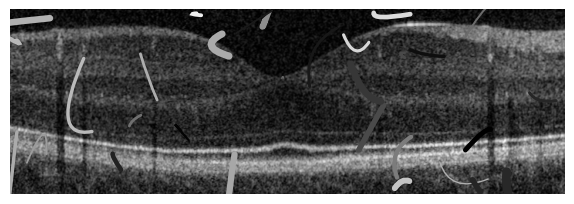

Epoch 2: Best cost = 1.2811767826085787
Displaying best individual from Epoch 2


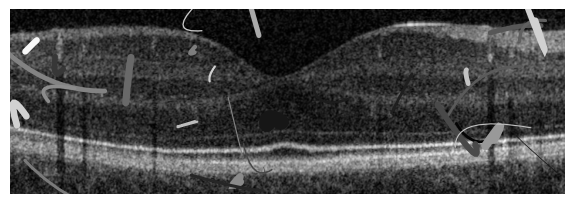

Epoch 3: Best cost = 1.3008004634282828
Displaying best individual from Epoch 3


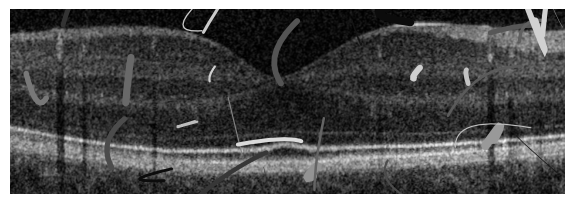

Epoch 4: Best cost = 1.2505328700337854
Displaying best individual from Epoch 4


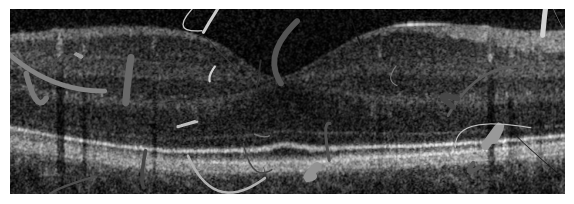

Epoch 5: Best cost = 1.1841637479682596
Displaying best individual from Epoch 5


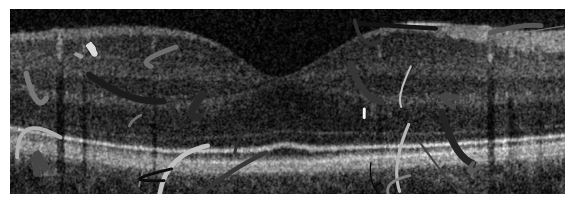

Epoch 6: Best cost = 1.2405027287602954
Displaying best individual from Epoch 6


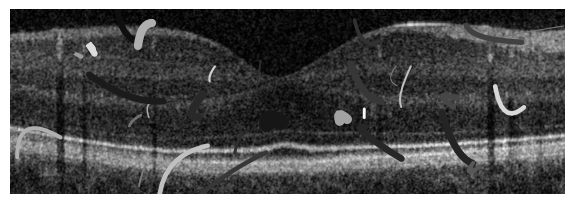

Epoch 7: Best cost = 1.220567433679461
Displaying best individual from Epoch 7


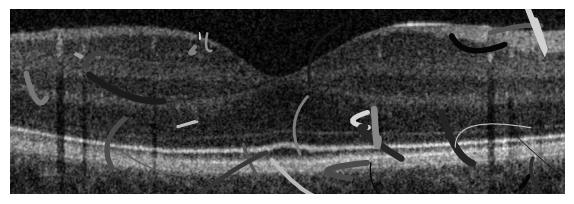

Epoch 8: Best cost = 1.2034834304586366
Displaying best individual from Epoch 8


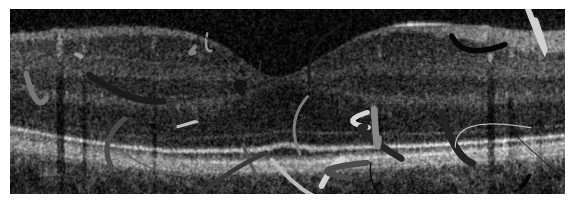

Epoch 9: Best cost = 1.1817806943695912
Displaying best individual from Epoch 9


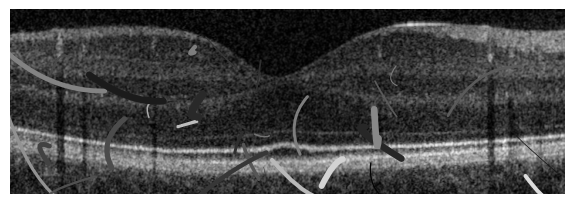

Epoch 10: Best cost = 1.1461780188144315
Displaying best individual from Epoch 10


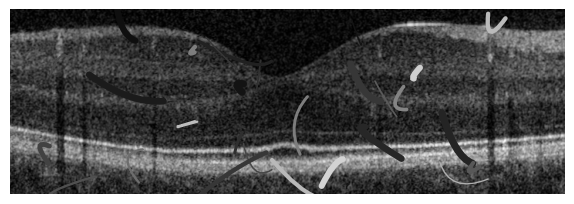

Epoch 11: Best cost = 1.129078212231544
Displaying best individual from Epoch 11


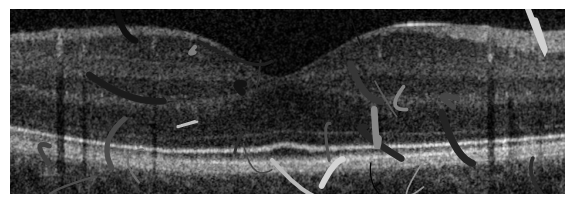

Epoch 12: Best cost = 1.0912850363313145
Displaying best individual from Epoch 12


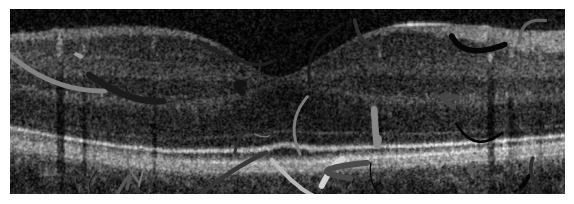

Epoch 13: Best cost = 1.090685003270127
Displaying best individual from Epoch 13


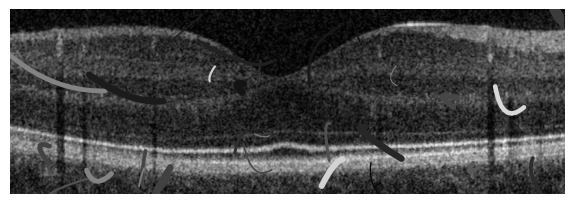

Epoch 14: Best cost = 1.040786128668475
Displaying best individual from Epoch 14


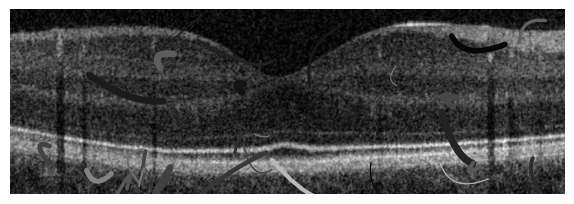

Epoch 15: Best cost = 1.0370688181463465
Displaying best individual from Epoch 15


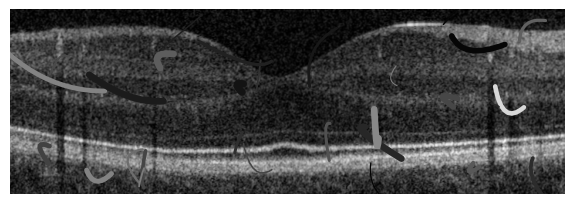

Epoch 16: Best cost = 1.0191011588792758
Displaying best individual from Epoch 16


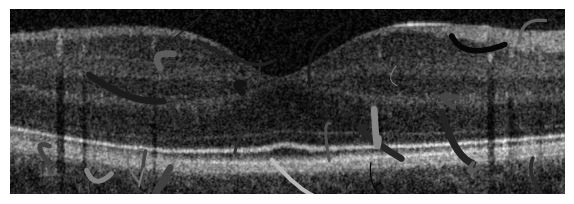

Epoch 17: Best cost = 0.9908616336139354
Displaying best individual from Epoch 17


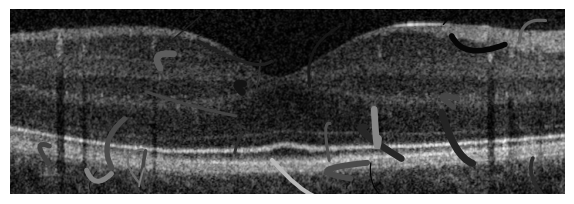

Epoch 18: Best cost = 0.9688313510346533
Displaying best individual from Epoch 18


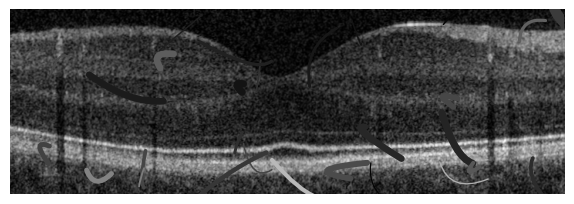

Epoch 19: Best cost = 0.9680712247928662
Displaying best individual from Epoch 19


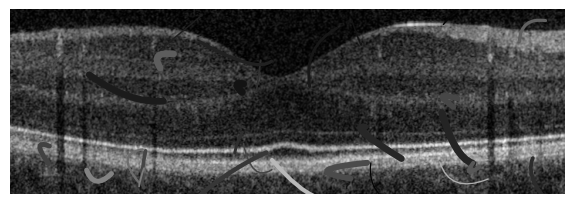

Epoch 20: Best cost = 0.9682847574213582
Displaying best individual from Epoch 20


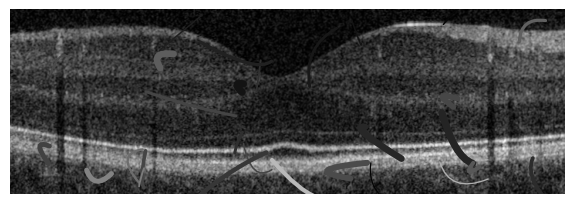

Epoch 21: Best cost = 0.9680797031196086
Displaying best individual from Epoch 21


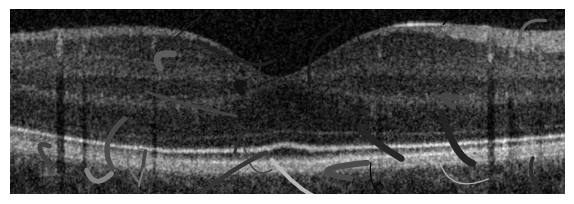

Epoch 22: Best cost = 0.9680797031196086
Displaying best individual from Epoch 22


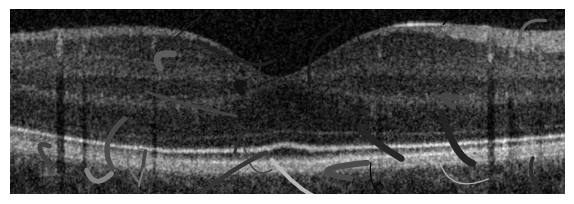

Epoch 23: Best cost = 0.9680797031196086
Displaying best individual from Epoch 23


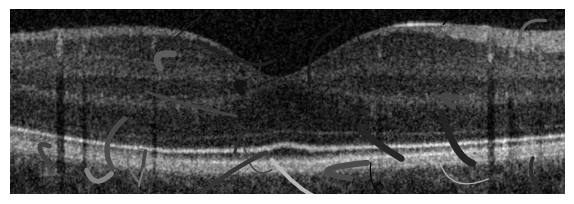

Epoch 24: Best cost = 0.9674339779361872
Displaying best individual from Epoch 24


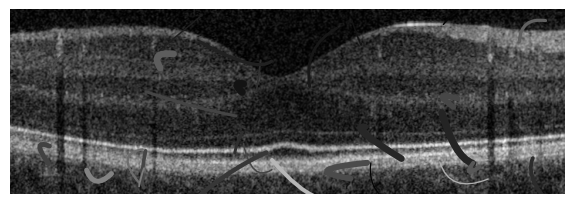

Epoch 25: Best cost = 0.9674339779361872
Displaying best individual from Epoch 25


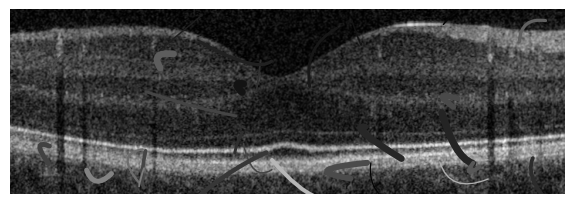

Epoch 26: Best cost = 0.9682604902618388
Displaying best individual from Epoch 26


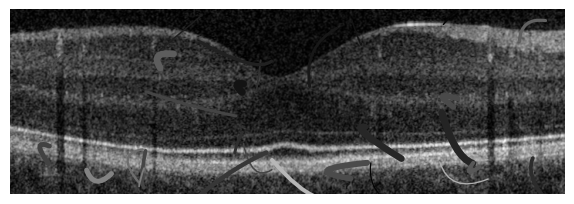

Epoch 27: Best cost = 0.967924002634189
Displaying best individual from Epoch 27


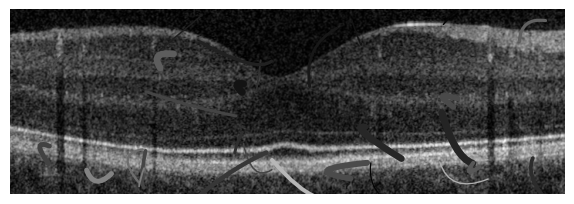

Epoch 28: Best cost = 0.967924002634189
Displaying best individual from Epoch 28


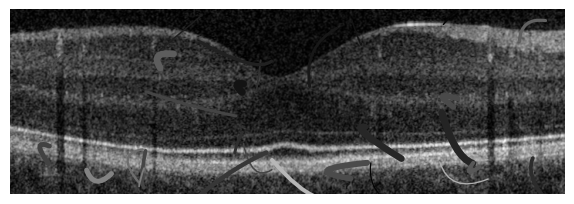

Epoch 29: Best cost = 0.967924002634189
Displaying best individual from Epoch 29


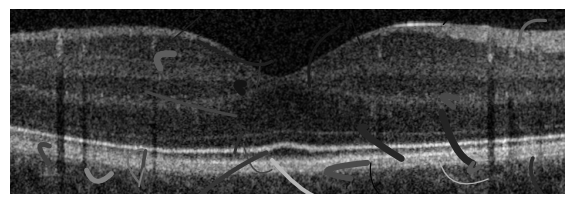

Stopping early at epoch 29. Best cost hasn't improved significantly for 5 epochs.
Best individual cost: 0.967924002634189


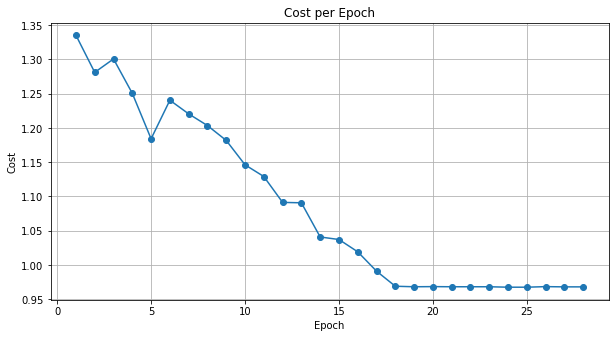

In [44]:
import warnings

warnings.filterwarnings('ignore')

def init_population(image, CLEW_SIZE=30):
    # Could potentially add logic to get more favourable population initialisation
    # For example manually adjusting worms to favourable positions??
    population = []

    for _ in range(POP_SIZE):

        instance = Instance(image)
        instance.add_clew(CLEW_SIZE)
        population.append(instance)

    return population

population = init_population(image)

ga = Genetic_Algorithm(mutation_rate=MUTATION_RATE, mutation_intensity=MUTATION_INTENSITY)

ga.run_genetic_algorithm(population, EPOCHS)

Epoch 1: Best cost = 0.9626189665078475
Displaying best individual from Epoch 1


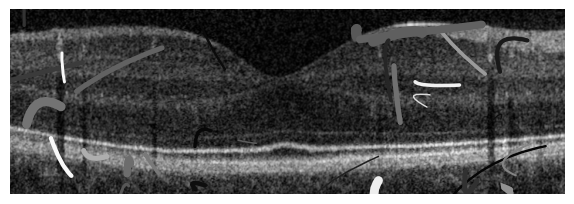

Epoch 2: Best cost = 0.9495424344401759
Displaying best individual from Epoch 2


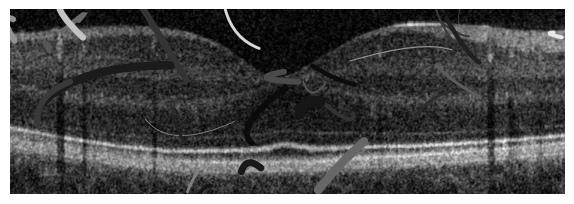

Epoch 3: Best cost = 0.931909375510062
Displaying best individual from Epoch 3


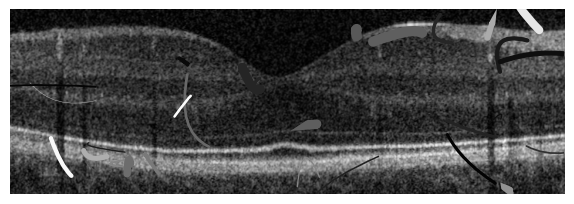

Epoch 4: Best cost = 0.8747134637047452
Displaying best individual from Epoch 4


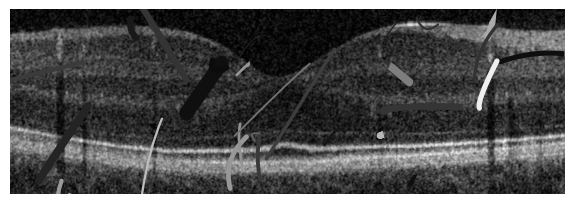

Epoch 5: Best cost = 0.8708633279191544
Displaying best individual from Epoch 5


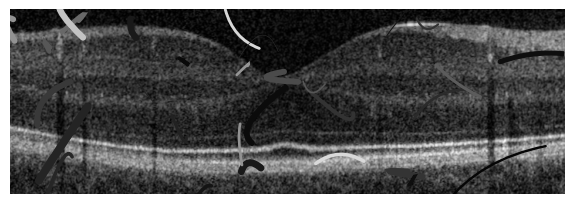

Epoch 6: Best cost = 0.8516176698297272
Displaying best individual from Epoch 6


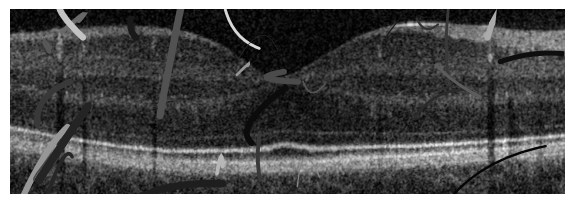

Epoch 7: Best cost = 0.8566768513121608
Displaying best individual from Epoch 7


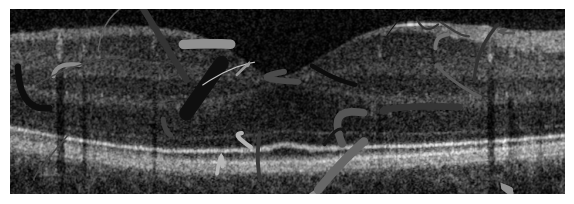

Epoch 8: Best cost = 0.8187063407522537
Displaying best individual from Epoch 8


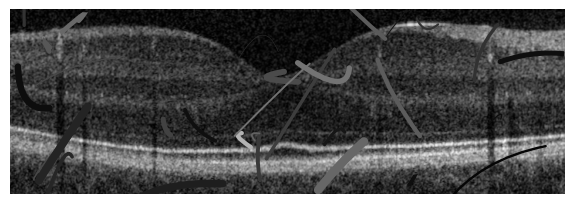

Epoch 9: Best cost = 0.80410561171894
Displaying best individual from Epoch 9


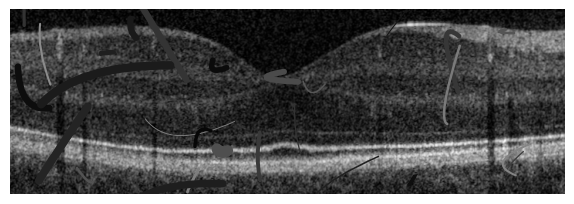

Epoch 10: Best cost = 0.7930587849869
Displaying best individual from Epoch 10


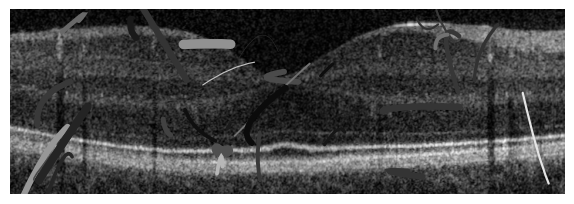

Epoch 11: Best cost = 0.7692754909848005
Displaying best individual from Epoch 11


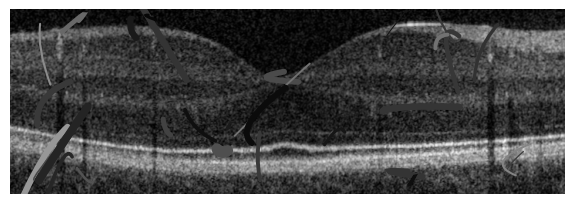

Epoch 12: Best cost = 0.7698673572794045
Displaying best individual from Epoch 12


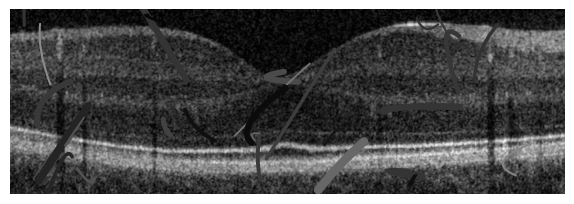

Epoch 13: Best cost = 0.7582430091657946
Displaying best individual from Epoch 13


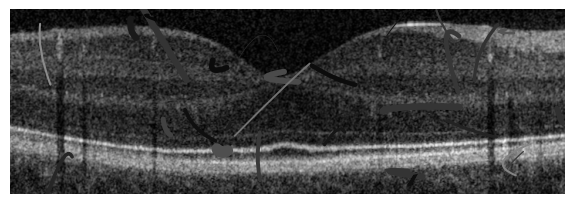

Epoch 14: Best cost = 0.745623874141419
Displaying best individual from Epoch 14


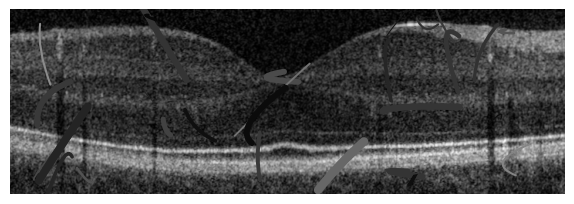

In [ ]:
from sklearn.model_selection import ParameterGrid

def run_genetic_algorithm_with_params(mutation_rate, mutation_intensity, population, EPOCHS):
    ga = Genetic_Algorithm(mutation_rate=mutation_rate, mutation_intensity=mutation_intensity)
    return ga.run_genetic_algorithm(population, EPOCHS)

param_grid = {
    'clew_size': [30],
    'mutation_rate': [0.01],
    'mutation_intensity': [0.01],
    'size': [0.5, 1.0, 1.5],
    'color': [0.5, 1.0, 1.5],
    'overlap': [1.0, 2.5, 5.0],
    'straightness': [0.001, 0.01, 0.1],
    'edge': [1.0, 3.0, 5.0]
}
    
grid = list(ParameterGrid(param_grid))

results = []

for params in grid:
    CLEW_SIZE = params['clew_size']
    WEIGHTS = {'size': params['size'], 'color': params['color'], 'overlap': params['overlap'], 'straightness': params['straightness'], 'edge': params['edge']}
    # Initialize population for each run to ensure fairness in comparisons
    population = init_population(image, CLEW_SIZE)  # Make sure the image is defined or passed appropriately
    #WEIGHTS = {'size': 1.0, 'color': 1.0, 'distance': 5.0, 'straightness': 1.0, 'edge': 1.0}
    
    # Run the genetic algorithm with the current parameters
    best_individual = run_genetic_algorithm_with_params(params['mutation_rate'], params['mutation_intensity'], population, EPOCHS)
    
    # Assume the run_genetic_algorithm function returns the best individual or some performance metric
    result = {
        'params': params,
        'cost': best_individual.cost  # Assuming the best individual has a cost attribute
    }
    results.append(result)
    print(f"Tested with {params}: Best Cost={best_individual.cost}")

# Find the best configuration
best_result = min(results, key=lambda x: x['cost'])
print(f"Best configuration: {best_result['params']} with Cost={best_result['cost']}")

In [38]:
# Assuming 'results' is your list of dictionaries containing parameters and their respective costs.
best_result = min(results, key=lambda x: x['cost'])

# Display the best result
print("The best result is:")
print(f"Parameters: {best_result['params']}")
print(f"Cost: {best_result['cost']}")

The best result is:
Parameters: {'clew_size': 20, 'color': 0.5, 'edge': 1.0, 'mutation_intensity': 0.01, 'mutation_rate': 0.01, 'overlap': 1.0, 'size': 0.5, 'straightness': 0.001}
Cost: 0.9777721901926453


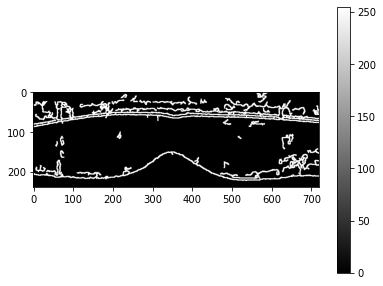

In [44]:
def detect_edges(image):
    # Check if image is already in grayscale, if not convert it
    if len(image.shape) == 3:  # This means image is colored (likely RGB or RGBA)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    # Ensure image is of type uint8
    if image.dtype != np.uint8:
        image = np.uint8(255 * image)  # Normalize back to range 0-255 if necessary
    # Apply GaussianBlur to reduce noise and improve edge detection
    blurred_image = cv2.GaussianBlur(image, (7, 7), 2)
    # Use Canny edge detector
    # edges = cv2.Canny(blurred_image, threshold1=135, threshold2=20)
    edges = cv2.Canny(blurred_image, threshold1=100, threshold2=20)

    # dilate the edges so they merge with one another
    kernel = np.ones((3,3), np.uint8) # REMEMBER THIS IS SOMETHING TO ADJUST SEE BOT (7, 7)
    dilated_edges = cv2.dilate(edges, kernel, iterations=1)
    return dilated_edges

edges = detect_edges(image)

# Displaying the edges
plt.figure()
plt.imshow(edges, cmap='gray')
plt.colorbar()
plt.show()

The best result is:
Parameters: {'clew_size': 10, 'color': 0.5, 'edge': 1.0, 'mutation_intensity': 0.01, 'mutation_rate': 0.05, 'overlap': 5.0, 'size': 0.5, 'straightness': 0.0}
Cost: 0.045523603259346

Parameters: {'clew_size': 20, 'color': 0.5, 'edge': 1.0, 'mutation_intensity': 0.01, 'mutation_rate': 0.01, 'overlap': 2.5, 'size': 0.5, 'straightness': 0.01}
Cost: 1.332259864790154223

# Optuna

[I 2024-05-08 14:17:31,087] A new study created in RDB with name: study_7


Epoch 1: Best cost = 1.3839563479463242
Displaying best individual from Epoch 1


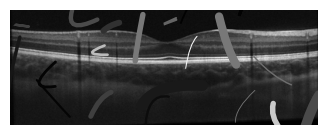

Epoch 2: Best cost = 1.3832125388619863
Displaying best individual from Epoch 2


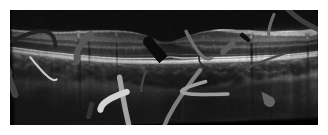

Epoch 3: Best cost = 1.3857052746736345
Displaying best individual from Epoch 3


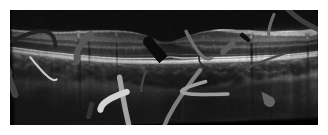

Epoch 4: Best cost = 1.3857052746736345
Displaying best individual from Epoch 4


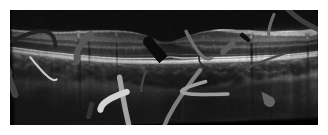

Epoch 5: Best cost = 1.3640184179707022
Displaying best individual from Epoch 5


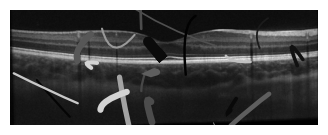

Epoch 6: Best cost = 1.3301971596313615
Displaying best individual from Epoch 6


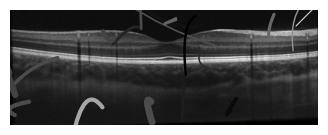

Epoch 7: Best cost = 1.3432763934570935
Displaying best individual from Epoch 7


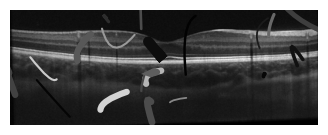

Epoch 8: Best cost = 1.331152729156082
Displaying best individual from Epoch 8


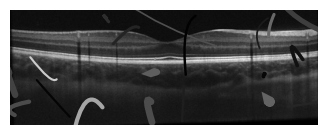

Epoch 9: Best cost = 1.3191218487111942
Displaying best individual from Epoch 9


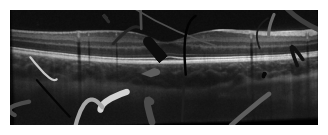

Epoch 10: Best cost = 1.3161028794667338
Displaying best individual from Epoch 10


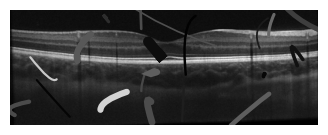

Epoch 11: Best cost = 1.2998317727419615
Displaying best individual from Epoch 11


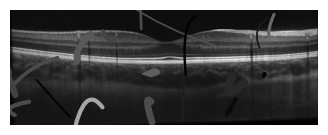

Epoch 12: Best cost = 1.2833646827935312
Displaying best individual from Epoch 12


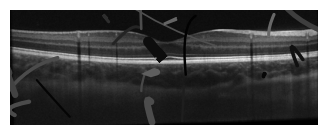

Epoch 13: Best cost = 1.2833646827935312
Displaying best individual from Epoch 13


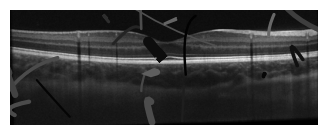

Epoch 14: Best cost = 1.2789882998341533
Displaying best individual from Epoch 14


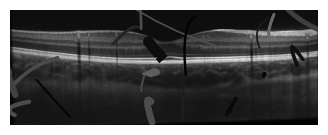

Epoch 15: Best cost = 1.2789882998341533
Displaying best individual from Epoch 15


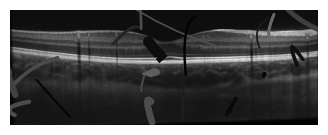

Epoch 16: Best cost = 1.2789882998341533
Displaying best individual from Epoch 16


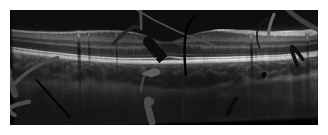

Epoch 17: Best cost = 1.2796533066017788
Displaying best individual from Epoch 17


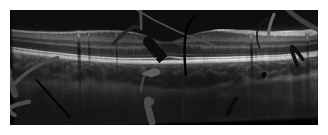

Epoch 18: Best cost = 1.2796533066017788
Displaying best individual from Epoch 18


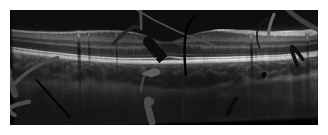

Epoch 19: Best cost = 1.2796533066017788
Displaying best individual from Epoch 19


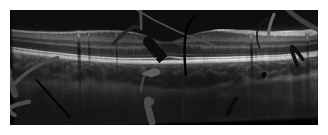

Stopping early at epoch 19. Best cost hasn't improved significantly for 5 epochs.
Best individual cost: 1.2796533066017788


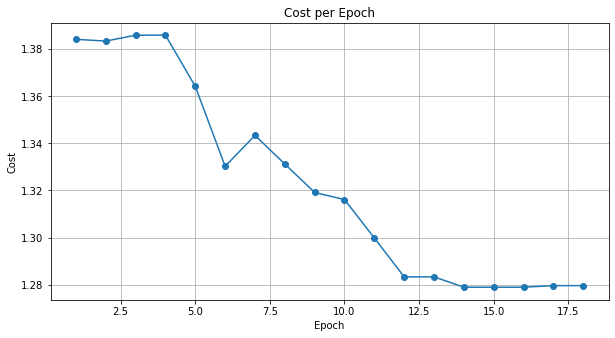

[I 2024-05-08 14:19:39,683] Trial 0 finished with value: 1.2796533066017788 and parameters: {'mutation_rate': 0.01, 'mutation_intensity': 0.01, 'size': 1.5, 'color': 1.0, 'overlap': 2.5, 'straightness': 0.1, 'edge': 3.0, 'edge_overlap': 3.0}. Best is trial 0 with value: 1.2796533066017788.


Epoch 1: Best cost = 1.4177113555936007
Displaying best individual from Epoch 1


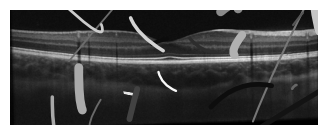

Epoch 2: Best cost = 1.3691715269033227
Displaying best individual from Epoch 2


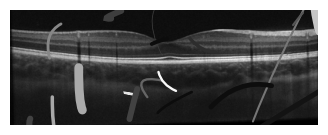

Epoch 3: Best cost = 1.3725274819615874
Displaying best individual from Epoch 3


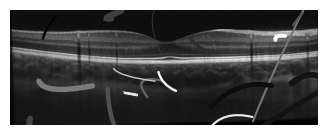

Epoch 4: Best cost = 1.3621601802844727
Displaying best individual from Epoch 4


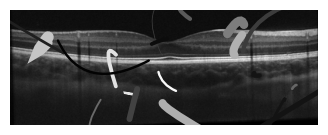

Epoch 5: Best cost = 1.367106024097258
Displaying best individual from Epoch 5


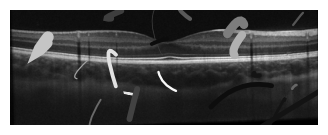

Epoch 6: Best cost = 1.3667923346560584
Displaying best individual from Epoch 6


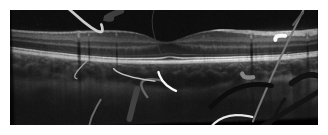

Epoch 7: Best cost = 1.324221062539609
Displaying best individual from Epoch 7


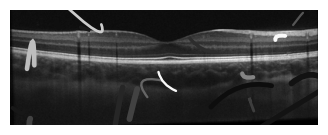

Epoch 8: Best cost = 1.323867237130462
Displaying best individual from Epoch 8


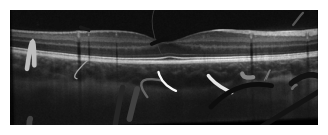

Epoch 9: Best cost = 1.3175359640129127
Displaying best individual from Epoch 9


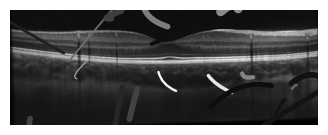

Epoch 10: Best cost = 1.2937925961456906
Displaying best individual from Epoch 10


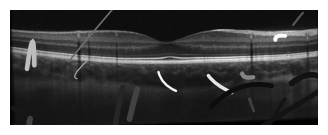

Epoch 11: Best cost = 1.2233434350552121
Displaying best individual from Epoch 11


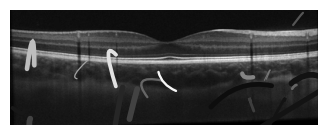

Epoch 12: Best cost = 1.223091391873425
Displaying best individual from Epoch 12


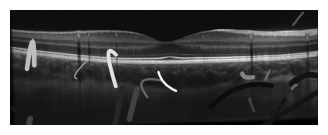

Epoch 13: Best cost = 1.2206697736701584
Displaying best individual from Epoch 13


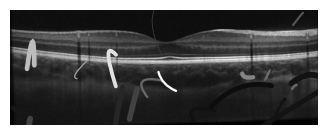

Epoch 14: Best cost = 1.218677514724125
Displaying best individual from Epoch 14


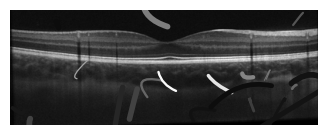

Epoch 15: Best cost = 1.2168427258083185
Displaying best individual from Epoch 15


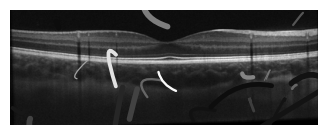

Epoch 16: Best cost = 1.2156918622150208
Displaying best individual from Epoch 16


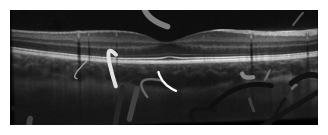

Epoch 17: Best cost = 1.2156918622150208
Displaying best individual from Epoch 17


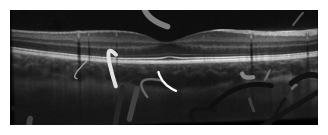

Epoch 18: Best cost = 1.2153515837038333
Displaying best individual from Epoch 18


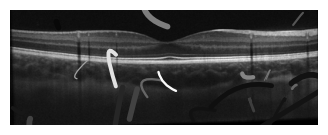

Epoch 19: Best cost = 1.2157635340527082
Displaying best individual from Epoch 19


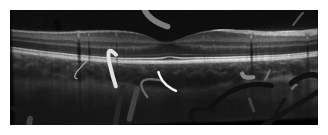

Epoch 20: Best cost = 1.2194530653164763
Displaying best individual from Epoch 20


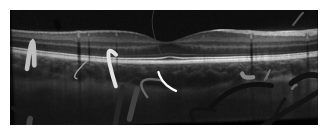

Epoch 21: Best cost = 1.2194485685532115
Displaying best individual from Epoch 21


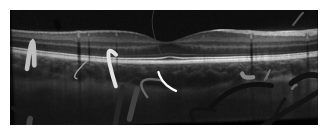

Epoch 22: Best cost = 1.2192799488490993
Displaying best individual from Epoch 22


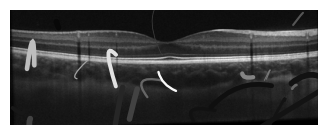

Epoch 23: Best cost = 1.219153598776561
Displaying best individual from Epoch 23


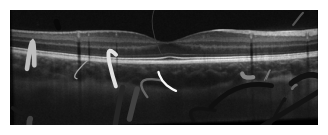

Stopping early at epoch 23. Best cost hasn't improved significantly for 5 epochs.
Best individual cost: 1.219153598776561


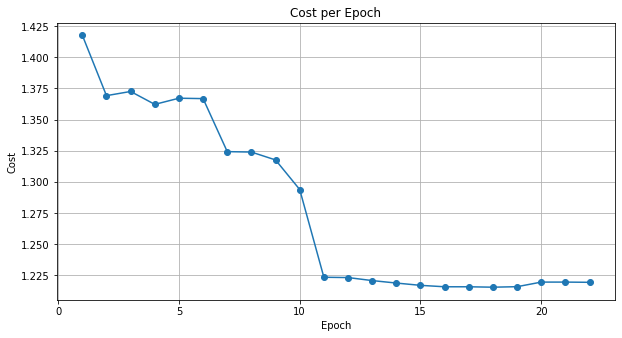

[I 2024-05-08 14:22:15,236] Trial 1 finished with value: 1.219153598776561 and parameters: {'mutation_rate': 0.02, 'mutation_intensity': 0.02, 'size': 0.5, 'color': 1.0, 'overlap': 2.5, 'straightness': 0.001, 'edge': 1.0, 'edge_overlap': 1.0}. Best is trial 1 with value: 1.219153598776561.


Epoch 1: Best cost = 1.3911402819828136
Displaying best individual from Epoch 1


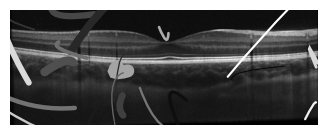

Epoch 2: Best cost = 1.4141143543356396
Displaying best individual from Epoch 2


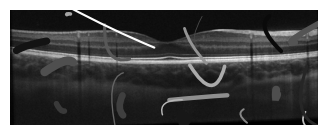

Epoch 3: Best cost = 1.3920676534643477
Displaying best individual from Epoch 3


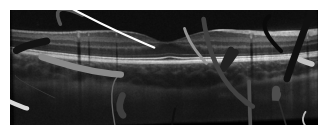

Epoch 4: Best cost = 1.397665590127362
Displaying best individual from Epoch 4


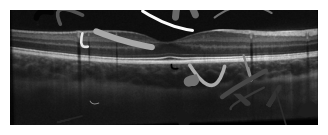

Epoch 5: Best cost = 1.397665590127362
Displaying best individual from Epoch 5


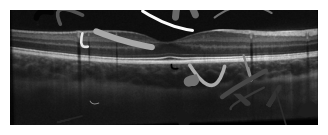

Epoch 6: Best cost = 1.373689530021794
Displaying best individual from Epoch 6


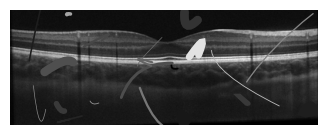

Epoch 7: Best cost = 1.373689530021794
Displaying best individual from Epoch 7


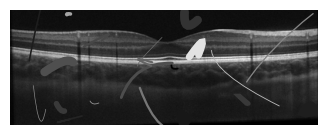

Epoch 8: Best cost = 1.3550425006324953
Displaying best individual from Epoch 8


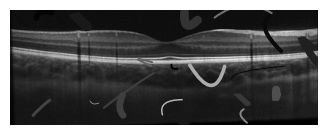

Epoch 9: Best cost = 1.3478374460649525
Displaying best individual from Epoch 9


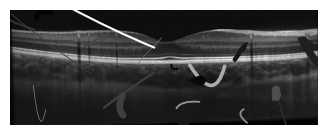

Epoch 10: Best cost = 1.320644272856412
Displaying best individual from Epoch 10


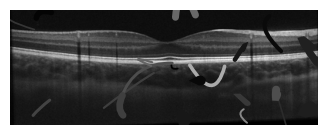

Epoch 11: Best cost = 1.3090100776919065
Displaying best individual from Epoch 11


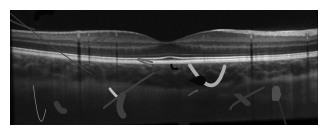

Epoch 12: Best cost = 1.296441545035845
Displaying best individual from Epoch 12


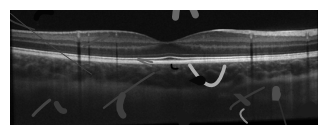

Epoch 13: Best cost = 1.29628734611158
Displaying best individual from Epoch 13


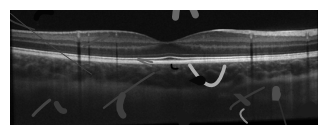

Epoch 14: Best cost = 1.281102039679439
Displaying best individual from Epoch 14


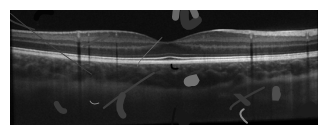

Epoch 15: Best cost = 1.2501665857548154
Displaying best individual from Epoch 15


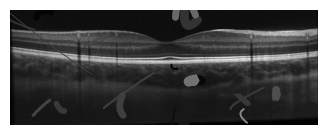

Epoch 16: Best cost = 1.2430026213090573
Displaying best individual from Epoch 16


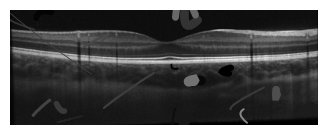

Epoch 17: Best cost = 1.2430026213090573
Displaying best individual from Epoch 17


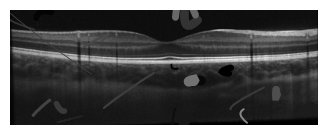

Epoch 18: Best cost = 1.236931075698171
Displaying best individual from Epoch 18


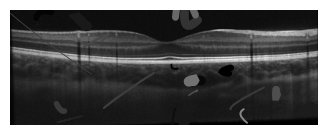

Epoch 19: Best cost = 1.2365619962268999
Displaying best individual from Epoch 19


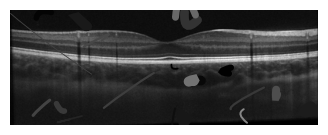

Epoch 20: Best cost = 1.2365619962268999
Displaying best individual from Epoch 20


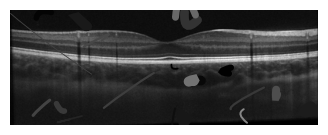

Epoch 21: Best cost = 1.2364464901189924
Displaying best individual from Epoch 21


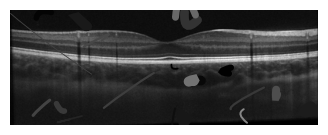

Epoch 22: Best cost = 1.2364464901189924
Displaying best individual from Epoch 22


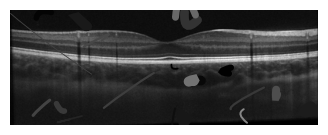

Epoch 23: Best cost = 1.2364464901189924
Displaying best individual from Epoch 23


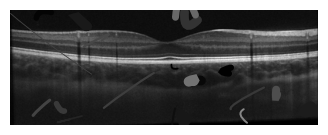

Epoch 24: Best cost = 1.2364464901189924
Displaying best individual from Epoch 24


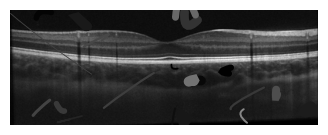

Epoch 25: Best cost = 1.2364464901189924
Displaying best individual from Epoch 25


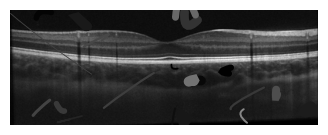

Epoch 26: Best cost = 1.2364464901189924
Displaying best individual from Epoch 26


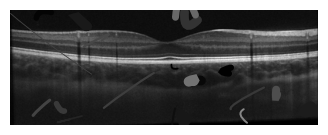

Stopping early at epoch 26. Best cost hasn't improved significantly for 5 epochs.
Best individual cost: 1.2364464901189924


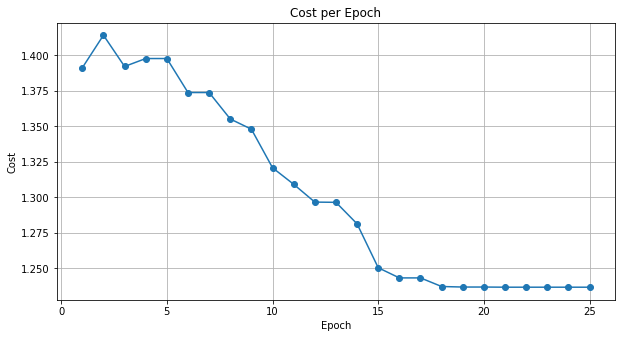

[I 2024-05-08 14:25:07,985] Trial 2 finished with value: 1.2364464901189924 and parameters: {'mutation_rate': 0.01, 'mutation_intensity': 0.01, 'size': 0.5, 'color': 1.0, 'overlap': 2.5, 'straightness': 0.001, 'edge': 1.0, 'edge_overlap': 5.0}. Best is trial 1 with value: 1.219153598776561.


Epoch 1: Best cost = 1.4324761452816808
Displaying best individual from Epoch 1


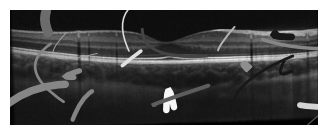

Epoch 2: Best cost = 1.4178109906271108
Displaying best individual from Epoch 2


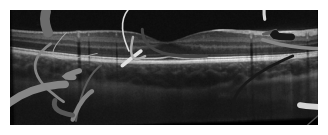

Epoch 3: Best cost = 1.4178859473827512
Displaying best individual from Epoch 3


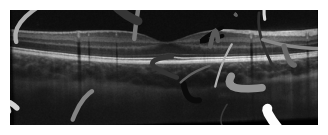

Epoch 4: Best cost = 1.3930032891273536
Displaying best individual from Epoch 4


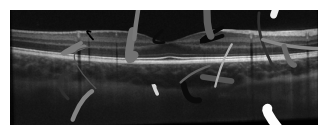

Epoch 5: Best cost = 1.3669350113765297
Displaying best individual from Epoch 5


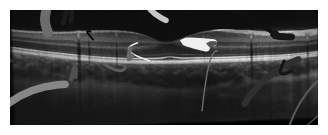

Epoch 6: Best cost = 1.3308977048895914
Displaying best individual from Epoch 6


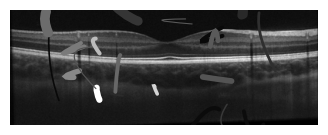

Epoch 7: Best cost = 1.3517628497542769
Displaying best individual from Epoch 7


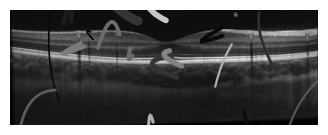

Epoch 8: Best cost = 1.3510707175038326
Displaying best individual from Epoch 8


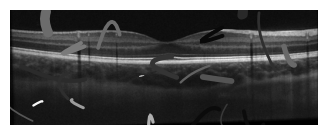

Epoch 9: Best cost = 1.3135476520533025
Displaying best individual from Epoch 9


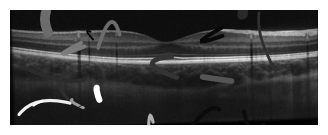

Epoch 10: Best cost = 1.2793418314579847
Displaying best individual from Epoch 10


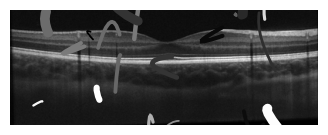

Epoch 11: Best cost = 1.1925153799373103
Displaying best individual from Epoch 11


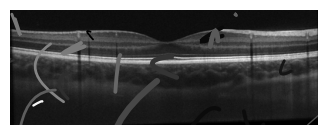

Epoch 12: Best cost = 1.1928844277099686
Displaying best individual from Epoch 12


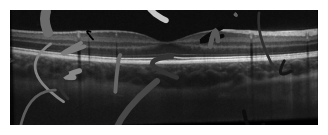

Epoch 13: Best cost = 1.2111877158331947
Displaying best individual from Epoch 13


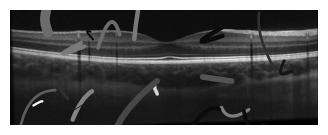

Epoch 14: Best cost = 1.2108008285226957
Displaying best individual from Epoch 14


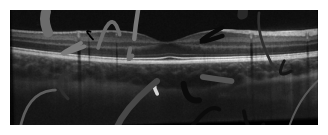

Epoch 15: Best cost = 1.1907665962992462
Displaying best individual from Epoch 15


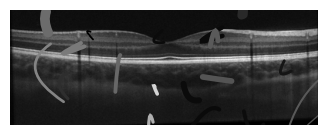

Epoch 16: Best cost = 1.1768409559479562
Displaying best individual from Epoch 16


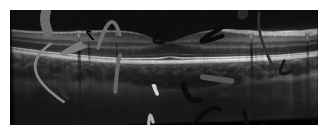

Epoch 17: Best cost = 1.1767984450262428
Displaying best individual from Epoch 17


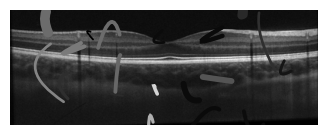

Epoch 18: Best cost = 1.1767984450262428
Displaying best individual from Epoch 18


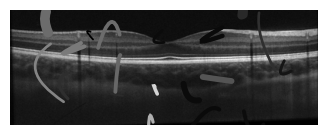

Epoch 19: Best cost = 1.1767984450262428
Displaying best individual from Epoch 19


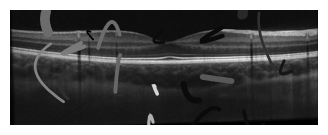

Epoch 20: Best cost = 1.2462156332269434
Displaying best individual from Epoch 20


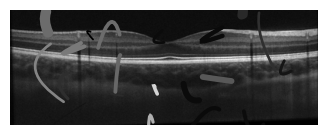

Epoch 21: Best cost = 1.2709367945503067
Displaying best individual from Epoch 21


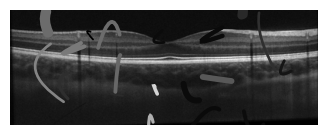

Epoch 22: Best cost = 1.2709367945503067
Displaying best individual from Epoch 22


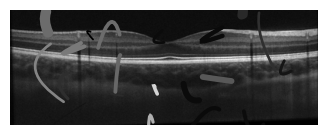

Stopping early at epoch 22. Best cost hasn't improved significantly for 5 epochs.
Best individual cost: 1.2709367945503067


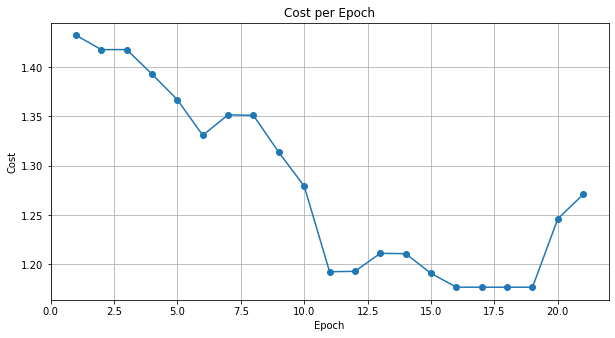

[I 2024-05-08 14:27:36,837] Trial 3 finished with value: 1.2709367945503067 and parameters: {'mutation_rate': 0.02, 'mutation_intensity': 0.02, 'size': 1.5, 'color': 0.5, 'overlap': 1.0, 'straightness': 0.01, 'edge': 1.0, 'edge_overlap': 3.0}. Best is trial 1 with value: 1.219153598776561.


Epoch 1: Best cost = 1.5640714024261098
Displaying best individual from Epoch 1


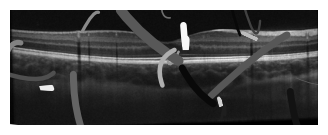

Epoch 2: Best cost = 1.3659864452490122
Displaying best individual from Epoch 2


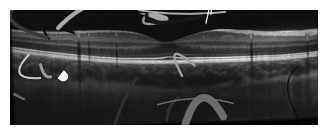

Epoch 3: Best cost = 1.36493012789353
Displaying best individual from Epoch 3


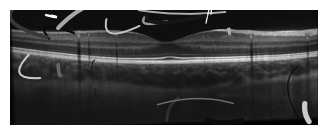

Epoch 4: Best cost = 1.35138240911797
Displaying best individual from Epoch 4


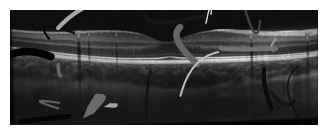

Epoch 5: Best cost = 1.3530308733668055
Displaying best individual from Epoch 5


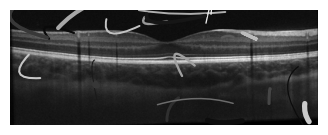

Epoch 6: Best cost = 1.3462897962736597
Displaying best individual from Epoch 6


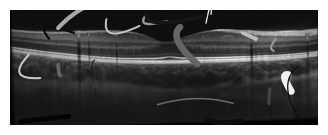

Epoch 7: Best cost = 1.3353496328749284
Displaying best individual from Epoch 7


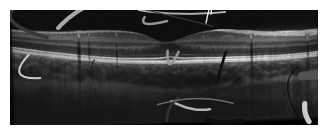

Epoch 8: Best cost = 1.330359197691505
Displaying best individual from Epoch 8


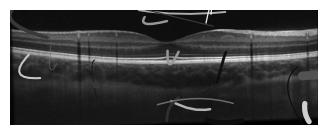

Epoch 9: Best cost = 1.306442406967391
Displaying best individual from Epoch 9


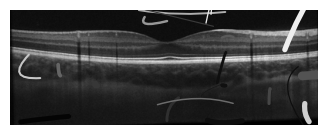

Epoch 10: Best cost = 1.2848413199529596
Displaying best individual from Epoch 10


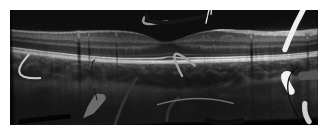

Epoch 11: Best cost = 1.2796148678938415
Displaying best individual from Epoch 11


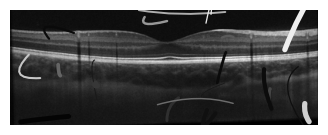

Epoch 12: Best cost = 1.271191061987168
Displaying best individual from Epoch 12


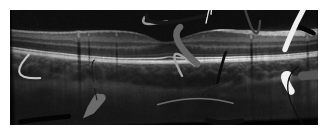

Epoch 13: Best cost = 1.2354905363429671
Displaying best individual from Epoch 13


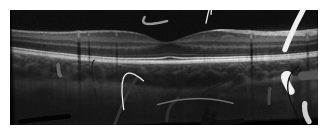

Epoch 14: Best cost = 1.2259641791109863
Displaying best individual from Epoch 14


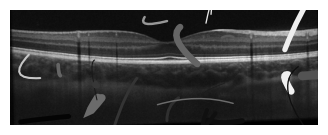

Epoch 15: Best cost = 1.2154296122171926
Displaying best individual from Epoch 15


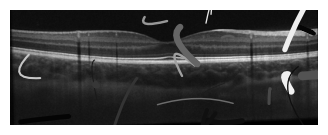

Epoch 16: Best cost = 1.2145838981207278
Displaying best individual from Epoch 16


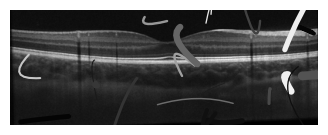

Epoch 17: Best cost = 1.2053954607216049
Displaying best individual from Epoch 17


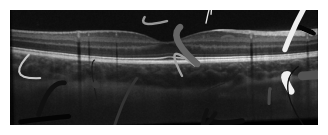

Epoch 18: Best cost = 1.204740473833977
Displaying best individual from Epoch 18


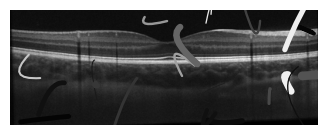

Epoch 19: Best cost = 1.204740473833977
Displaying best individual from Epoch 19


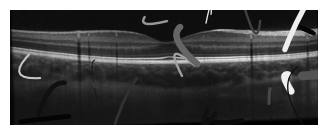

Epoch 20: Best cost = 1.205445299101513
Displaying best individual from Epoch 20


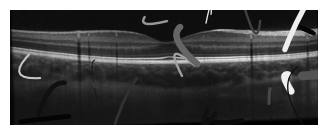

Epoch 21: Best cost = 1.2040159049790349
Displaying best individual from Epoch 21


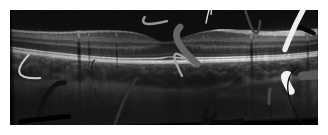

Epoch 22: Best cost = 1.292460779227511
Displaying best individual from Epoch 22


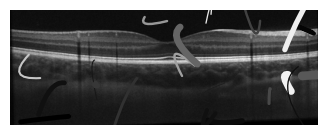

Epoch 23: Best cost = 1.2967282606028578
Displaying best individual from Epoch 23


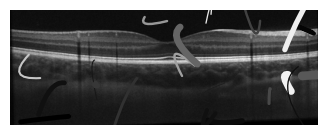

Epoch 24: Best cost = 1.294737068230739
Displaying best individual from Epoch 24


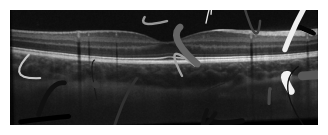

Epoch 25: Best cost = 1.294737068230739
Displaying best individual from Epoch 25


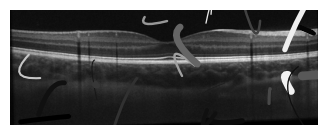

Epoch 26: Best cost = 1.295156536011045
Displaying best individual from Epoch 26


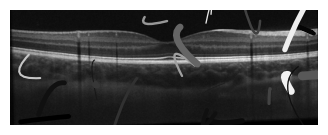

Stopping early at epoch 26. Best cost hasn't improved significantly for 5 epochs.
Best individual cost: 1.295156536011045


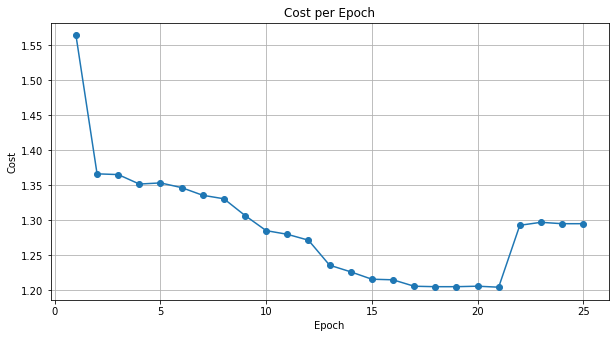

[I 2024-05-08 14:30:39,282] Trial 4 finished with value: 1.295156536011045 and parameters: {'mutation_rate': 0.02, 'mutation_intensity': 0.02, 'size': 1.5, 'color': 1.0, 'overlap': 5.0, 'straightness': 0.1, 'edge': 1.0, 'edge_overlap': 5.0}. Best is trial 1 with value: 1.219153598776561.


Epoch 1: Best cost = 1.4324320729765785
Displaying best individual from Epoch 1


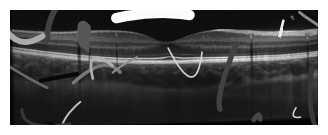

Epoch 2: Best cost = 1.442969198654647
Displaying best individual from Epoch 2


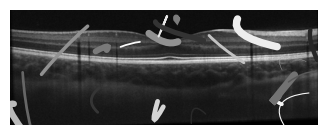

Epoch 3: Best cost = 1.3867315702332497
Displaying best individual from Epoch 3


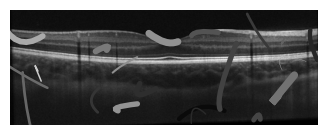

Epoch 4: Best cost = 1.3925653645614684
Displaying best individual from Epoch 4


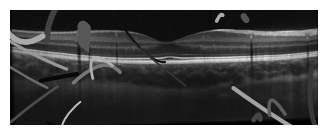

Epoch 5: Best cost = 1.3884426582677425
Displaying best individual from Epoch 5


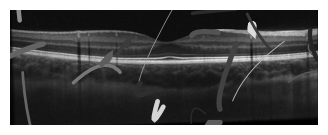

Epoch 6: Best cost = 1.3474410263347407
Displaying best individual from Epoch 6


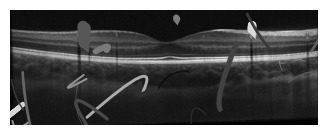

Epoch 7: Best cost = 1.3359962094318691
Displaying best individual from Epoch 7


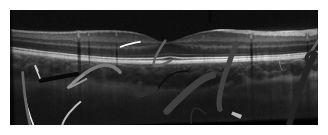

Epoch 8: Best cost = 1.3036535077097082
Displaying best individual from Epoch 8


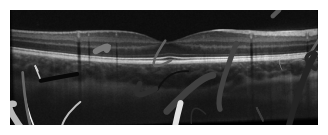

Epoch 9: Best cost = 1.2700611668664237
Displaying best individual from Epoch 9


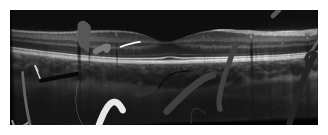

Epoch 10: Best cost = 1.2830262792179816
Displaying best individual from Epoch 10


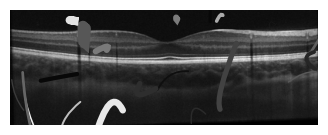

Epoch 11: Best cost = 1.2612249744696677
Displaying best individual from Epoch 11


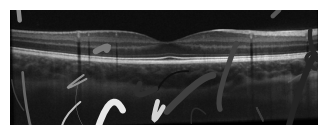

Epoch 12: Best cost = 1.2422458936529321
Displaying best individual from Epoch 12


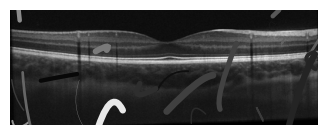

Epoch 13: Best cost = 1.2331868419978742
Displaying best individual from Epoch 13


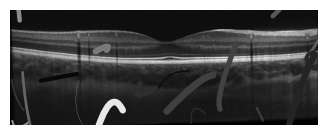

Epoch 14: Best cost = 1.2180691490440274
Displaying best individual from Epoch 14


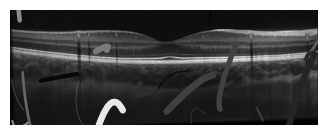

Epoch 15: Best cost = 1.2184182969968262
Displaying best individual from Epoch 15


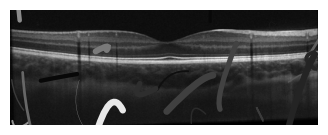

Epoch 16: Best cost = 1.2184904610572913
Displaying best individual from Epoch 16


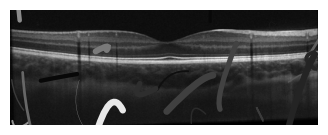

Epoch 17: Best cost = 1.2184904610572913
Displaying best individual from Epoch 17


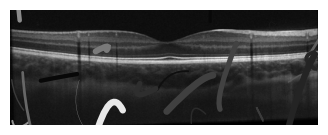

Epoch 18: Best cost = 1.2184904610572913
Displaying best individual from Epoch 18


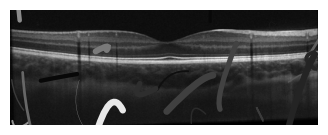

Epoch 19: Best cost = 1.2491021008842897
Displaying best individual from Epoch 19


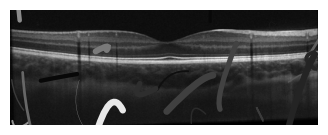

Stopping early at epoch 19. Best cost hasn't improved significantly for 5 epochs.
Best individual cost: 1.2491021008842897


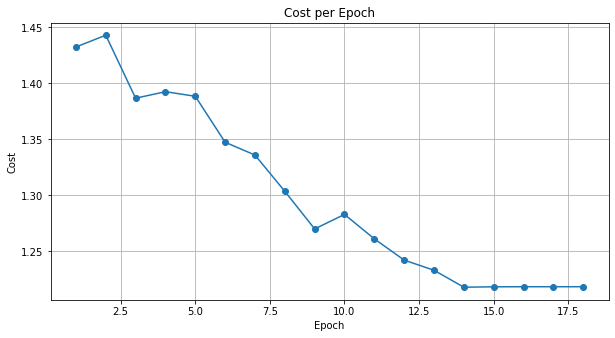

[I 2024-05-08 14:32:47,707] Trial 5 finished with value: 1.2491021008842897 and parameters: {'mutation_rate': 0.01, 'mutation_intensity': 0.01, 'size': 1.0, 'color': 0.5, 'overlap': 2.5, 'straightness': 0.1, 'edge': 3.0, 'edge_overlap': 3.0}. Best is trial 1 with value: 1.219153598776561.


Epoch 1: Best cost = 1.6668445419737397
Displaying best individual from Epoch 1


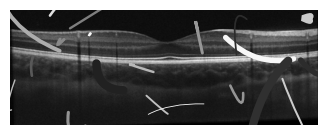

Epoch 2: Best cost = 1.3999887362948462
Displaying best individual from Epoch 2


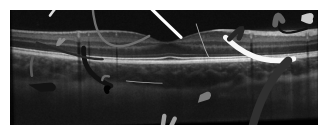

Epoch 3: Best cost = 1.3971241975101292
Displaying best individual from Epoch 3


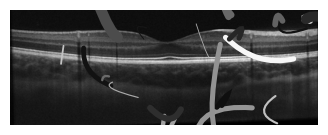

Epoch 4: Best cost = 1.3483787986864861
Displaying best individual from Epoch 4


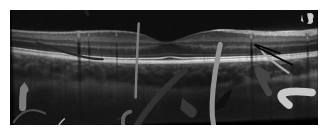

Epoch 5: Best cost = 1.3653173973332329
Displaying best individual from Epoch 5


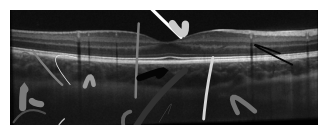

Epoch 6: Best cost = 1.3429359131321126
Displaying best individual from Epoch 6


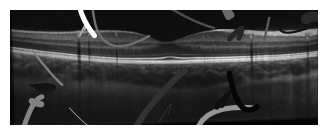

Epoch 7: Best cost = 1.3311208868349866
Displaying best individual from Epoch 7


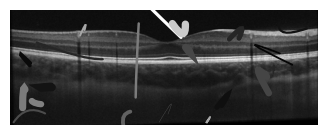

Epoch 8: Best cost = 1.3325379396992434
Displaying best individual from Epoch 8


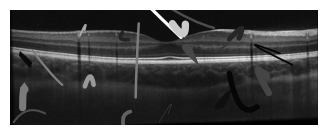

Epoch 9: Best cost = 1.313952725847975
Displaying best individual from Epoch 9


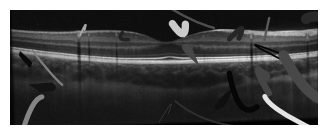

Epoch 10: Best cost = 1.3060061608587872
Displaying best individual from Epoch 10


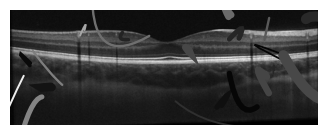

Epoch 11: Best cost = 1.290859393257191
Displaying best individual from Epoch 11


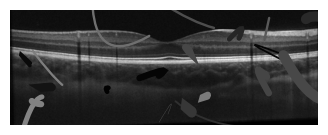

Epoch 12: Best cost = 1.2719502216447496
Displaying best individual from Epoch 12


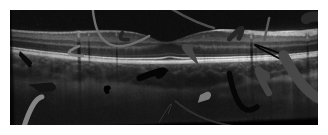

Epoch 13: Best cost = 1.2574889416124149
Displaying best individual from Epoch 13


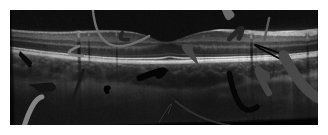

Epoch 14: Best cost = 1.2549735196940477
Displaying best individual from Epoch 14


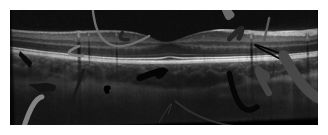

Epoch 15: Best cost = 1.2549735196940477
Displaying best individual from Epoch 15


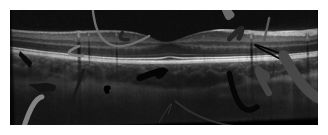

Epoch 16: Best cost = 1.2549735196940477
Displaying best individual from Epoch 16


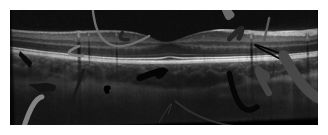

Epoch 17: Best cost = 1.2549735196940477
Displaying best individual from Epoch 17


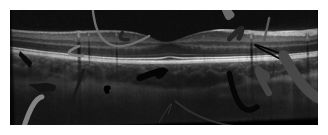

Epoch 18: Best cost = 1.2549735196940477
Displaying best individual from Epoch 18


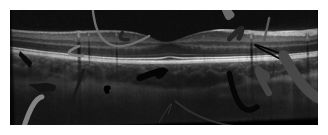

Epoch 19: Best cost = 1.2549735196940477
Displaying best individual from Epoch 19


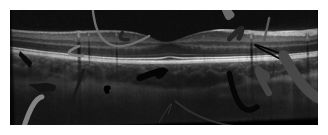

Stopping early at epoch 19. Best cost hasn't improved significantly for 5 epochs.
Best individual cost: 1.2549735196940477


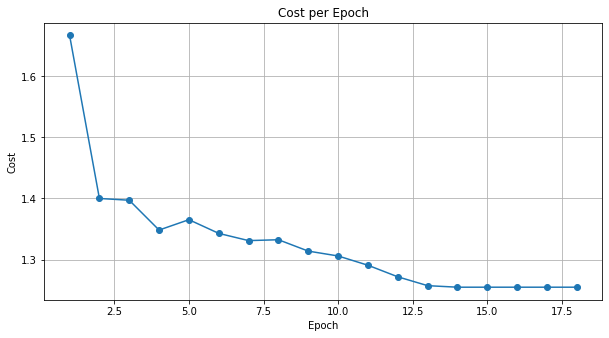

[I 2024-05-08 14:34:56,443] Trial 6 finished with value: 1.2549735196940477 and parameters: {'mutation_rate': 0.01, 'mutation_intensity': 0.01, 'size': 0.5, 'color': 0.5, 'overlap': 5.0, 'straightness': 0.01, 'edge': 1.0, 'edge_overlap': 3.0}. Best is trial 1 with value: 1.219153598776561.


Epoch 1: Best cost = 1.545474969645769
Displaying best individual from Epoch 1


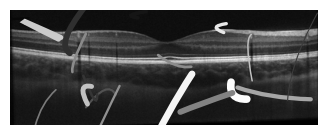

Epoch 2: Best cost = 1.4365170630791462
Displaying best individual from Epoch 2


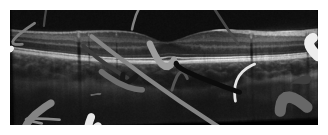

Epoch 3: Best cost = 1.4099275717120598
Displaying best individual from Epoch 3


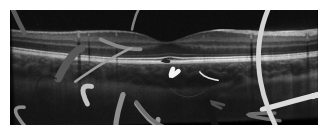

Epoch 4: Best cost = 1.3811753344930269
Displaying best individual from Epoch 4


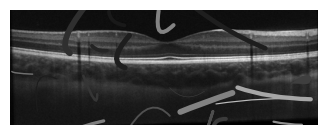

Epoch 5: Best cost = 1.3760950724511998
Displaying best individual from Epoch 5


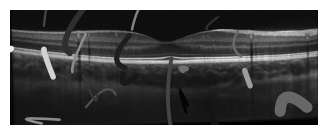

Epoch 6: Best cost = 1.3827470813631189
Displaying best individual from Epoch 6


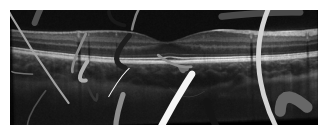

Epoch 7: Best cost = 1.3610192183167222
Displaying best individual from Epoch 7


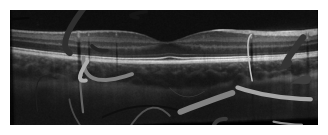

Epoch 8: Best cost = 1.3429521413321721
Displaying best individual from Epoch 8


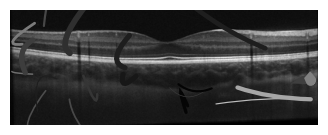

Epoch 9: Best cost = 1.3297703659340212
Displaying best individual from Epoch 9


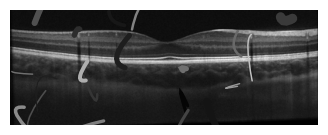

Epoch 10: Best cost = 1.3030369290153803
Displaying best individual from Epoch 10


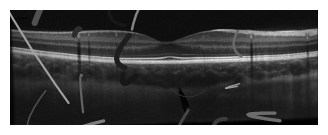

Epoch 11: Best cost = 1.276081569920627
Displaying best individual from Epoch 11


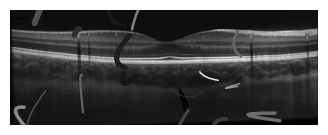

Epoch 12: Best cost = 1.2782757051190512
Displaying best individual from Epoch 12


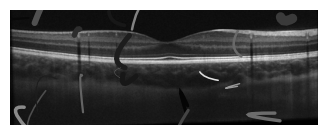

Epoch 13: Best cost = 1.2314530446268028
Displaying best individual from Epoch 13


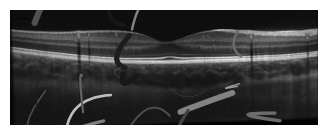

Epoch 14: Best cost = 1.2218433862377354
Displaying best individual from Epoch 14


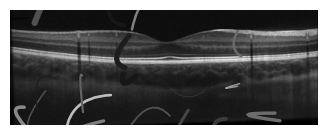

Epoch 15: Best cost = 1.2137768665243265
Displaying best individual from Epoch 15


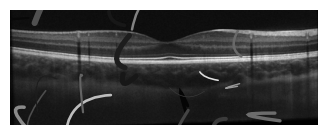

Epoch 16: Best cost = 1.2134028609339174
Displaying best individual from Epoch 16


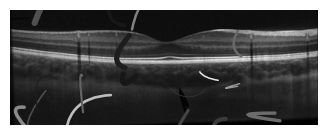

Epoch 17: Best cost = 1.2094707160719684
Displaying best individual from Epoch 17


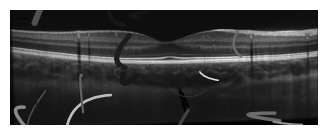

Epoch 18: Best cost = 1.2032212332969139
Displaying best individual from Epoch 18


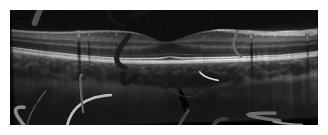

Epoch 19: Best cost = 1.2024524401945726
Displaying best individual from Epoch 19


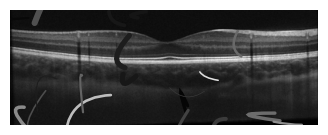

Epoch 20: Best cost = 1.2022912093507585
Displaying best individual from Epoch 20


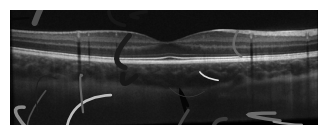

Epoch 21: Best cost = 1.2022912093507585
Displaying best individual from Epoch 21


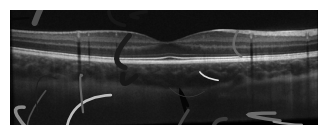

Epoch 22: Best cost = 1.2022912093507585
Displaying best individual from Epoch 22


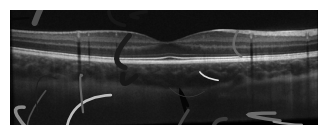

Epoch 23: Best cost = 1.2019769212956153
Displaying best individual from Epoch 23


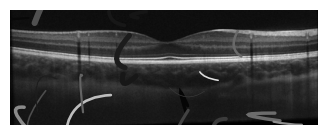

Epoch 24: Best cost = 1.316804849285043
Displaying best individual from Epoch 24


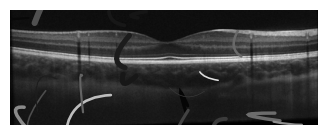

Epoch 25: Best cost = 1.316804849285043
Displaying best individual from Epoch 25


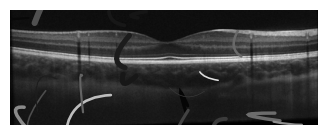

Epoch 26: Best cost = 1.3162928345291693
Displaying best individual from Epoch 26


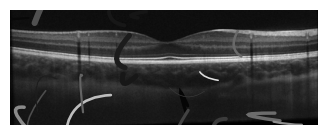

Epoch 27: Best cost = 1.3161207616307926
Displaying best individual from Epoch 27


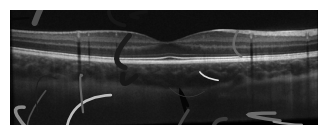

Epoch 28: Best cost = 1.3161207616307926
Displaying best individual from Epoch 28


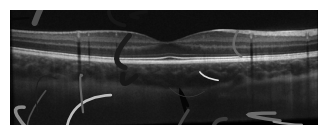

Stopping early at epoch 28. Best cost hasn't improved significantly for 5 epochs.
Best individual cost: 1.3161207616307926


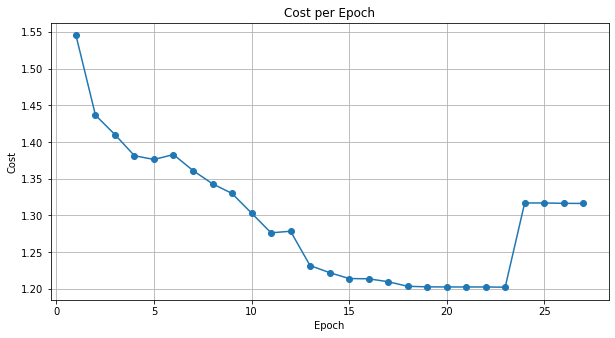

[I 2024-05-08 14:38:00,625] Trial 7 finished with value: 1.3161207616307926 and parameters: {'mutation_rate': 0.01, 'mutation_intensity': 0.01, 'size': 0.5, 'color': 0.5, 'overlap': 2.5, 'straightness': 0.001, 'edge': 5.0, 'edge_overlap': 1.0}. Best is trial 1 with value: 1.219153598776561.


Epoch 1: Best cost = 1.5618875733865205
Displaying best individual from Epoch 1


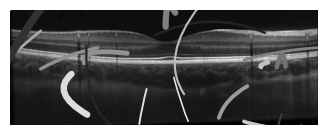

Epoch 2: Best cost = 1.4743715083044213
Displaying best individual from Epoch 2


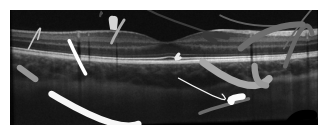

Epoch 3: Best cost = 1.3526264173234546
Displaying best individual from Epoch 3


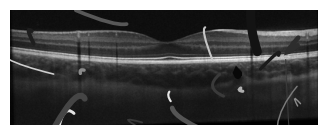

Epoch 4: Best cost = 1.3526264173234546
Displaying best individual from Epoch 4


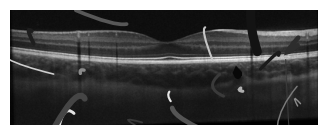

Epoch 5: Best cost = 1.3670767970406947
Displaying best individual from Epoch 5


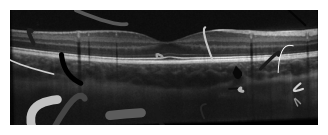

Epoch 6: Best cost = 1.3550603888758594
Displaying best individual from Epoch 6


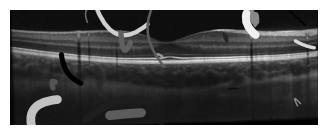

Epoch 7: Best cost = 1.3550603888758594
Displaying best individual from Epoch 7


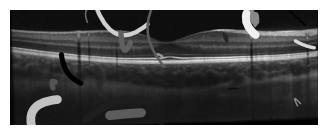

Epoch 8: Best cost = 1.3364055084843935
Displaying best individual from Epoch 8


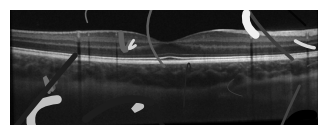

Epoch 9: Best cost = 1.3174144749850873
Displaying best individual from Epoch 9


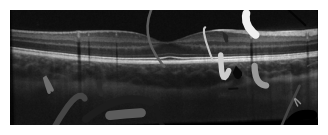

Epoch 10: Best cost = 1.2829605100712624
Displaying best individual from Epoch 10


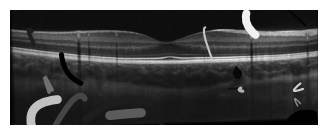

Epoch 11: Best cost = 1.2756856124277576
Displaying best individual from Epoch 11


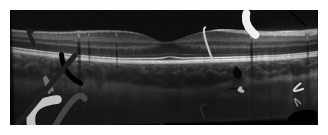

Epoch 12: Best cost = 1.2106050796430141
Displaying best individual from Epoch 12


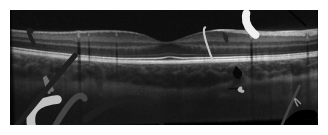

Epoch 13: Best cost = 1.2022996663079164
Displaying best individual from Epoch 13


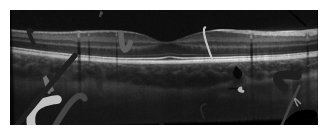

Epoch 14: Best cost = 1.1876564692395561
Displaying best individual from Epoch 14


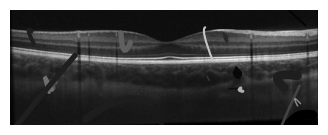

Epoch 15: Best cost = 1.1792884608369698
Displaying best individual from Epoch 15


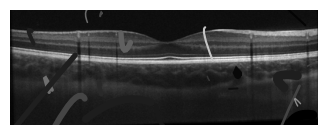

Epoch 16: Best cost = 1.1753160519674846
Displaying best individual from Epoch 16


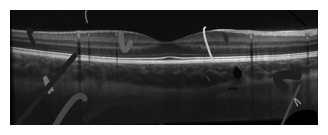

Epoch 17: Best cost = 1.170960831859011
Displaying best individual from Epoch 17


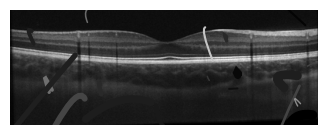

Epoch 18: Best cost = 1.170960831859011
Displaying best individual from Epoch 18


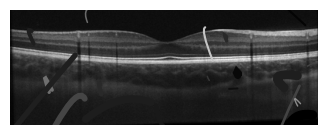

Epoch 19: Best cost = 1.170960831859011
Displaying best individual from Epoch 19


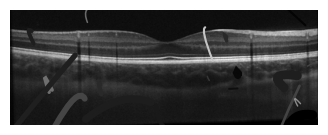

Epoch 20: Best cost = 1.223380863423512
Displaying best individual from Epoch 20


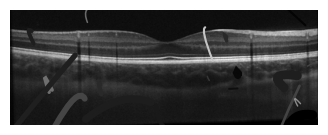

Epoch 21: Best cost = 1.223380863423512
Displaying best individual from Epoch 21


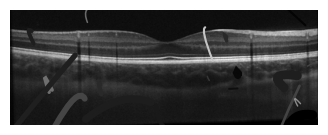

Epoch 22: Best cost = 1.223380863423512
Displaying best individual from Epoch 22


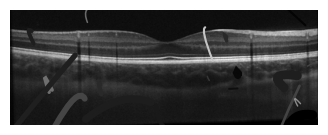

Stopping early at epoch 22. Best cost hasn't improved significantly for 5 epochs.
Best individual cost: 1.223380863423512


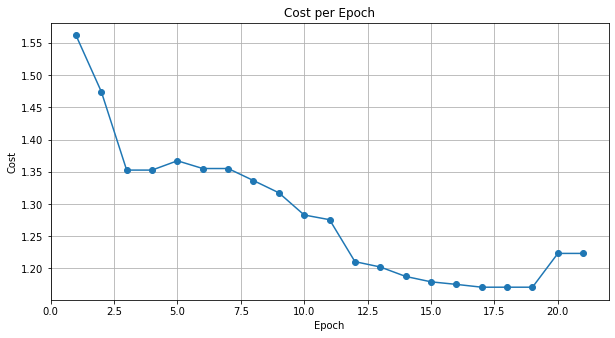

[I 2024-05-08 14:40:27,004] Trial 8 finished with value: 1.223380863423512 and parameters: {'mutation_rate': 0.01, 'mutation_intensity': 0.02, 'size': 0.5, 'color': 0.5, 'overlap': 1.0, 'straightness': 0.001, 'edge': 3.0, 'edge_overlap': 5.0}. Best is trial 1 with value: 1.219153598776561.


Epoch 1: Best cost = 1.5547128340550755
Displaying best individual from Epoch 1


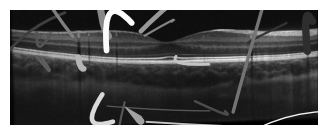

Epoch 2: Best cost = 1.5729488654625172
Displaying best individual from Epoch 2


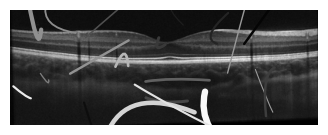

Epoch 3: Best cost = 1.372037450570021
Displaying best individual from Epoch 3


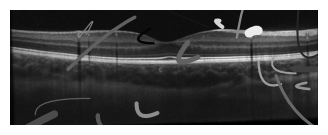

Epoch 4: Best cost = 1.3480962903518556
Displaying best individual from Epoch 4


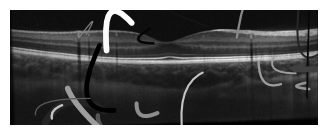

Epoch 5: Best cost = 1.3447430768655586
Displaying best individual from Epoch 5


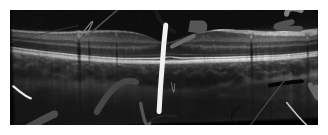

Epoch 6: Best cost = 1.3379371794163553
Displaying best individual from Epoch 6


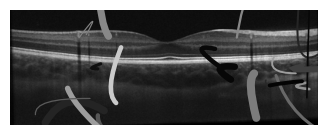

Epoch 7: Best cost = 1.3155515510821143
Displaying best individual from Epoch 7


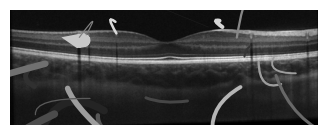

Epoch 8: Best cost = 1.3149694915701502
Displaying best individual from Epoch 8


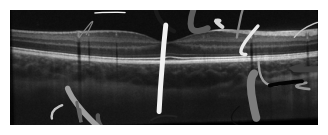

[W 2024-05-08 14:41:27,160] Trial 9 failed with parameters: {'mutation_rate': 0.02, 'mutation_intensity': 0.02, 'size': 1.0, 'color': 0.5, 'overlap': 2.5, 'straightness': 0.01, 'edge': 1.0, 'edge_overlap': 1.0} because of the following error: IndexError('index 153 is out of bounds for axis 0 with size 150').
Traceback (most recent call last):
  File "C:\ProgramData\miniconda3\envs\test\Lib\site-packages\optuna\study\_optimize.py", line 196, in _run_trial
    value_or_values = func(trial)
                      ^^^^^^^^^^^
  File "C:\Users\leon_\AppData\Local\Temp\ipykernel_46664\33663174.py", line 30, in objective
    best_individual = run_genetic_algorithm_with_params(mutation_rate, mutation_intensity, population, 50)  # EPOCHS fixed to 100 for example
                      ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\leon_\AppData\Local\Temp\ipykernel_46664\2654101133.py", line 5, in run_genetic_algorithm_with_params
    return 

IndexError: index 153 is out of bounds for axis 0 with size 150

In [373]:
import optuna
# study 3 was decent
# Create a study object that uses an SQLite database to store its state.
study = optuna.create_study(
    study_name='study_7',  # Unique identifier of the study.
    storage='sqlite:///study_7.db',  # Uses SQLite database stored as a .db file.
    direction='minimize',
    load_if_exists=True  # This will reload an existing study if the study_name matches.
)

def objective(trial):
    # Define the hyperparameters as trial suggestions
    clew_size = 20  # Fixed as per your grid
    mutation_rate = trial.suggest_categorical('mutation_rate', [0.01, 0.02])
    mutation_intensity = trial.suggest_categorical('mutation_intensity', [0.01, 0.02])
    size = trial.suggest_categorical('size', [0.5, 1.0, 1.5])
    color = trial.suggest_categorical('color', [0.5, 1.0])
    overlap = trial.suggest_categorical('overlap', [1.0, 2.5, 5.0])
    straightness = trial.suggest_categorical('straightness', [0.001, 0.01, 0.1])
    edge = trial.suggest_categorical('edge', [1.0, 3.0, 5.0])
    edge_overlap = trial.suggest_categorical('edge_overlap', [1.0, 3.0, 5.0])

    # Assuming you have a function to initialize the population
    population = init_population(image, clew_size)

    # Setting weights based on the suggested values
    weights = {'size': size, 'color': color, 'overlap': overlap, 'straightness': straightness, 'edge': edge, 'edge_overlap': edge_overlap}
    
    # Run the genetic algorithm
    best_individual = run_genetic_algorithm_with_params(mutation_rate, mutation_intensity, population, 50)  # EPOCHS fixed to 100 for example

    # Return the cost of the best individual as the objective to minimize
    return best_individual.cost

# Execute an optimization by using the above-defined objective function wrapped in the number of trials or using timeout
study.optimize(objective, n_trials=200)  # You can set n_trials or timeout

print("Best value: ", study.best_trial.value)
print("Best params: ", study.best_trial.params)

## Testing Random Stuff Here

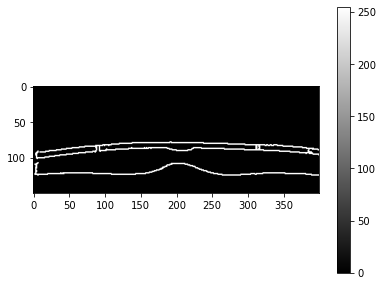

In [312]:
def detect_edges(image):
    # Check if image is already in grayscale, if not convert it
    if len(image.shape) == 3:  # This means image is colored (likely RGB or RGBA)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    # Ensure image is of type uint8
    if image.dtype != np.uint8:
        image = np.uint8(255 * image)  # Normalize back to range 0-255 if necessary
    # Apply GaussianBlur to reduce noise and improve edge detection
    blurred_image = cv2.GaussianBlur(image, (7, 7), 2)
    # Use Canny edge detector
    # edges = cv2.Canny(blurred_image, threshold1=135, threshold2=20)
    edges = cv2.Canny(blurred_image, threshold1=135, threshold2=20)

    # dilate the edges so they merge with one another
    kernel = np.ones((2,2), np.uint8) # REMEMBER THIS IS SOMETHING TO ADJUST SEE BOT (7, 7)
    dilated_edges = cv2.dilate(edges, kernel, iterations=1)
    return dilated_edges

edges = detect_edges(image)

# Displaying the edges
plt.figure()
plt.imshow(edges, cmap='gray')
plt.colorbar()
plt.show()

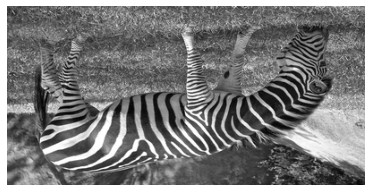

In [224]:
# Plotting the image
plt.imshow(image, cmap='gray')  # Use a grey colormap
plt.axis('off')  # Turn off axis numbers and ticks
plt.show()

In [ ]:
image = prep_image(IMAGE_DIR, IMAGE_NAME, MASK)

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Function to detect edges
def detect_edges(image):
    if len(image.shape) == 3:
        image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    if image.dtype != np.uint8:
        image = np.uint8(image)
    blurred_image = cv2.GaussianBlur(image, (7, 7), 2)
    edges = cv2.Canny(blurred_image, threshold1=110, threshold2=20)
    return edges

# Function to dilate edges
def dilate_edges(edges, iterations=1):
    kernel = np.ones((4,4), np.uint8)
    dilated_edges = cv2.dilate(edges, kernel, iterations=iterations)
    return dilated_edges

# Using the functions
edges = detect_edges(image)
dilated_edges = dilate_edges(edges)

# Displaying the edges
plt.figure(figsize=(20, 6))
plt.imshow(dilated_edges, cmap='gray')
plt.colorbar()
plt.show()


In [ ]:
from matplotlib.colors import Normalize

plt.figure(figsize=(20, 6))
plt.imshow(edges, cmap='gray', norm=Normalize(vmin=0, vmax=255))  # Normalize contrast
plt.colorbar()
plt.show()


In [ ]:
image.shape